# Exploration, Preprocessing and AR-Based Time-Series Forecasting of Weather Data

This notebook is a gentle introduction to time-series analysis and forecasting. We build a simple, compact pipeline: load weather data, resample to 1H, 6H, and 24H, explore core properties (trends, seasonality, stationarity, ACF/PACF) and preprocess the series. We then establish an AR baseline in two flavors, a small custom implementation and the built-in statsmodels AutoReg, and evaluate them across multiple horizons.

## Download and Load Data

In [ ]:
import kagglehub

# download latest version of the dataset
path = kagglehub.dataset_download("alistairking/weather-long-term-time-series-forecasting")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/weather-long-term-time-series-forecasting


In [ ]:
import os
import time
import numpy as np
import pandas as pd
from tabulate import tabulate
from google.colab import files

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns

from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.ar_model import AutoReg, ar_select_order

In [ ]:
# check what files are available
for filename in os.listdir(path):
  print(filename)

cleaned_weather.csv


In [ ]:
# load main csv into a DataFrame and preview first rows
weather_df = pd.read_csv(os.path.join(path, "cleaned_weather.csv"))
print(weather_df.head())

                  date        p     T    Tpot  Tdew    rh  VPmax  VPact  \
0  2020-01-01 00:10:00  1008.89  0.71  273.18 -1.33  86.1   6.43   5.54   
1  2020-01-01 00:20:00  1008.76  0.75  273.22 -1.44  85.2   6.45   5.49   
2  2020-01-01 00:30:00  1008.66  0.73  273.21 -1.48  85.1   6.44   5.48   
3  2020-01-01 00:40:00  1008.64  0.37  272.86 -1.64  86.3   6.27   5.41   
4  2020-01-01 00:50:00  1008.61  0.33  272.82 -1.50  87.4   6.26   5.47   

   VPdef    sh  ...      rho    wv  max. wv     wd  rain  raining  SWDR  PAR  \
0   0.89  3.42  ...  1280.62  1.02     1.60  224.3   0.0      0.0   0.0  0.0   
1   0.95  3.39  ...  1280.33  0.43     0.84  206.8   0.0      0.0   0.0  0.0   
2   0.96  3.39  ...  1280.29  0.61     1.48  197.1   0.0      0.0   0.0  0.0   
3   0.86  3.35  ...  1281.97  1.11     1.48  206.4   0.0      0.0   0.0  0.0   
4   0.79  3.38  ...  1282.08  0.49     1.40  209.6   0.0      0.0   0.0  0.0   

   max. PAR   Tlog  
0       0.0  11.45  
1       0.0  11.51  
2    

## Data Cleaning, Preprocessing and Exploration

In [ ]:
# shape and structure
print(f"Original DataFrame's shape: {weather_df.shape}")
print(f"Samples: {weather_df.shape[0]}")
print(f"Features: {weather_df.shape[1]}")
print(f"Feature Names: {list(weather_df.columns)}")
print(f"\nData Types:\n{weather_df.dtypes}")
print("Index dtype:", type(weather_df.index))

Original DataFrame's shape: (52696, 21)
Samples: 52696
Features: 21
Feature Names: ['date', 'p', 'T', 'Tpot', 'Tdew', 'rh', 'VPmax', 'VPact', 'VPdef', 'sh', 'H2OC', 'rho', 'wv', 'max. wv', 'wd', 'rain', 'raining', 'SWDR', 'PAR', 'max. PAR', 'Tlog']

Data Types:
date         object
p           float64
T           float64
Tpot        float64
Tdew        float64
rh          float64
VPmax       float64
VPact       float64
VPdef       float64
sh          float64
H2OC        float64
rho         float64
wv          float64
max. wv     float64
wd          float64
rain        float64
raining     float64
SWDR        float64
PAR         float64
max. PAR    float64
Tlog        float64
dtype: object
Index dtype: <class 'pandas.core.indexes.range.RangeIndex'>


In [ ]:
# index checks (check if the dataframe is sorted in ascending order and if there is a duplicatate at index)
print("Monotonic:", weather_df.index.is_monotonic_increasing)
print("Duplicate timestamps:", weather_df.index.duplicated().sum())

Monotonic: True
Duplicate timestamps: 0


In [ ]:
# feature selection (create a new df using a subset of the total number of features)
features = ["T", "wv", "SWDR", "rh", "rain"]
df = weather_df.copy()
df = df[["date"] + features]

print(df.head())

                  date     T    wv  SWDR    rh  rain
0  2020-01-01 00:10:00  0.71  1.02   0.0  86.1   0.0
1  2020-01-01 00:20:00  0.75  0.43   0.0  85.2   0.0
2  2020-01-01 00:30:00  0.73  0.61   0.0  85.1   0.0
3  2020-01-01 00:40:00  0.37  1.11   0.0  86.3   0.0
4  2020-01-01 00:50:00  0.33  0.49   0.0  87.4   0.0


In [ ]:
# datatime conversion and indexing of the new df
df['date'] = pd.to_datetime(df['date']) # convert date column from 'object' -> 'datetime64' (allows time-based operations)
df.set_index('date', inplace=True)  # set date as index of the DataFrame (easier analysis)

# add derived time features as new columns in the DataFrame
df['hour'] = df.index.hour
df['six_hour_slot'] = df.index.hour // 6  # 0 to 3 slots
# df['six_hour_label'] = df['six_hour_slot'].map({0: 'Night', 1: 'Morning', 2: 'Afternoon', 3: 'Evening'})

df['day'] = df.index.day
# df['month'] = df.index.month
# df['season'] = pd.cut(df.index.month, bins=[0, 3, 6, 9, 12], labels=['Winter', 'Spring', 'Summer', 'Fall'], right=False).astype('int32')

In [ ]:
# check if the new columns are correctly creeated
print(df.head(10))
# df[50:100]
# df[52100:52110]

                        T    wv  SWDR    rh  rain  hour  six_hour_slot  day
date                                                                       
2020-01-01 00:10:00  0.71  1.02   0.0  86.1   0.0     0              0    1
2020-01-01 00:20:00  0.75  0.43   0.0  85.2   0.0     0              0    1
2020-01-01 00:30:00  0.73  0.61   0.0  85.1   0.0     0              0    1
2020-01-01 00:40:00  0.37  1.11   0.0  86.3   0.0     0              0    1
2020-01-01 00:50:00  0.33  0.49   0.0  87.4   0.0     0              0    1
2020-01-01 01:00:00  0.34  0.63   0.0  87.1   0.0     1              0    1
2020-01-01 01:10:00  0.19  0.88   0.0  87.4   0.0     1              0    1
2020-01-01 01:20:00  0.03  1.05   0.0  88.1   0.0     1              0    1
2020-01-01 01:30:00  0.11  0.90   0.0  88.1   0.0     1              0    1
2020-01-01 01:40:00  0.22  0.62   0.0  87.4   0.0     1              0    1


In [ ]:
# basic df information
df.info()
# type(df.index)  # should be DatetimeIndex

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 52696 entries, 2020-01-01 00:10:00 to 2021-01-01 00:00:00
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   T              52696 non-null  float64
 1   wv             52696 non-null  float64
 2   SWDR           52696 non-null  float64
 3   rh             52696 non-null  float64
 4   rain           52696 non-null  float64
 5   hour           52696 non-null  int32  
 6   six_hour_slot  52696 non-null  int32  
 7   day            52696 non-null  int32  
dtypes: float64(5), int32(3)
memory usage: 3.0 MB


In [ ]:
# missing values and duplicates
print("Null values:\n", df.isnull().sum())
df.dropna(inplace=True) # drop Nans, if any

print("\nDuplicate values:", df.duplicated().sum())
df.drop_duplicates(inplace=True) # drop duplicates, if any
print("Duplicate values after drop:", df.duplicated().sum())

Null values:
 T                0
wv               0
SWDR             0
rh               0
rain             0
hour             0
six_hour_slot    0
day              0
dtype: int64

Duplicate values: 1
Duplicate values after drop: 0


In [ ]:
# summary statistics
print(df.describe())

                  T            wv          SWDR            rh          rain  \
count  52695.000000  52695.000000  52695.000000  52695.000000  52695.000000   
mean      10.818476      1.995953    131.332703     72.486683      0.011773   
std        7.468546     43.597345    215.737068     19.230165      0.123290   
min       -6.440000  -9999.000000      0.000000     21.160000      0.000000   
25%        4.590000      1.000000      0.000000     58.820000      0.000000   
50%       10.230000      1.770000      2.820000     75.400000      0.000000   
75%       16.180000      2.920000    182.900000     87.900000      0.000000   
max       34.800000     13.770000   1115.290000    100.000000     11.200000   

               hour  six_hour_slot           day  
count  52695.000000   52695.000000  52695.000000  
mean      11.500275       1.500085     15.754569  
std        6.922807       1.118121      8.810666  
min        0.000000       0.000000      1.000000  
25%        5.000000       0.00000

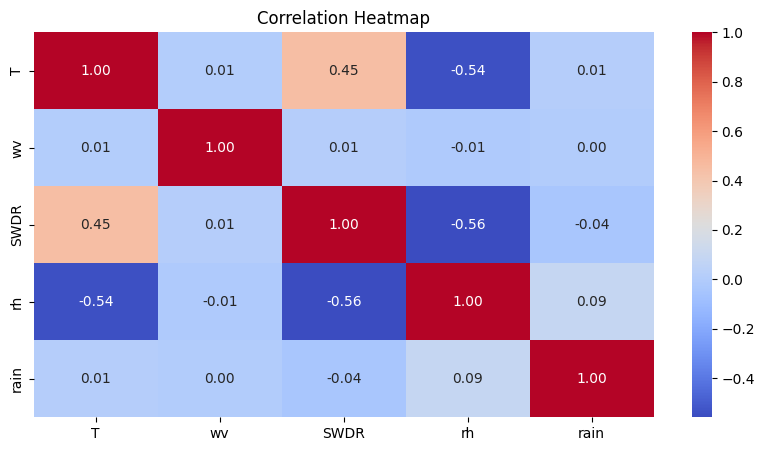

In [ ]:
# statistical correlations - "how strongly do these features co-vary every 10 minutes (original structure of data) ?"
time_resolutions = ["hour", "six_hour_slot", "day"]

# correlation matrix
corr_matrix = df.corr()
corr_matrix = corr_matrix.drop(index=time_resolutions, columns=time_resolutions)

# correlation heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

In [ ]:
# most correlated features
print(df.corr()["T"].sort_values(ascending=False).drop(["hour", "six_hour_slot"]), "\n")
print(df.corr()["wv"].sort_values(ascending=False).drop(["hour", "six_hour_slot"]), "\n")
print(df.corr()["SWDR"].sort_values(ascending=False).drop(["hour", "six_hour_slot"]), "\n")
print(df.corr()["rh"].sort_values(ascending=False).drop(["hour", "six_hour_slot"]), "\n")
print(df.corr()["rain"].sort_values(ascending=False).drop(["hour", "six_hour_slot"]))

T       1.000000
SWDR    0.448612
rain    0.008445
wv      0.007514
day     0.003630
rh     -0.540767
Name: T, dtype: float64 

wv      1.000000
SWDR    0.011061
T       0.007514
rain    0.001096
day    -0.000210
rh     -0.012581
Name: wv, dtype: float64 

SWDR    1.000000
T       0.448612
wv      0.011061
day     0.008985
rain   -0.043421
rh     -0.558298
Name: SWDR, dtype: float64 

rh      1.000000
rain    0.087430
wv     -0.012581
day    -0.050190
T      -0.540767
SWDR   -0.558298
Name: rh, dtype: float64 

rain    1.000000
rh      0.087430
day     0.009068
T       0.008445
wv      0.001096
SWDR   -0.043421
Name: rain, dtype: float64


In [ ]:
# what is this -0.54 (T vs rh)? -> when the temperature drops, the relative humidity increases (general corr)
temperature_rh_df = df[['T', 'rh']].copy()
print(temperature_rh_df.head())

                        T    rh
date                           
2020-01-01 00:10:00  0.71  86.1
2020-01-01 00:20:00  0.75  85.2
2020-01-01 00:30:00  0.73  85.1
2020-01-01 00:40:00  0.37  86.3
2020-01-01 00:50:00  0.33  87.4


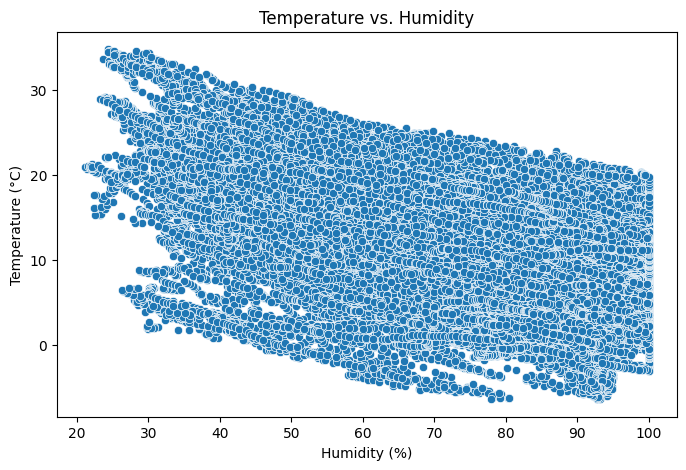

In [ ]:
plt.figure(figsize=(8, 5))
sns.scatterplot(data=df, x='rh', y='T')
plt.title("Temperature vs. Humidity")
plt.xlabel("Humidity (%)")
plt.ylabel("Temperature (°C)")
plt.show()

In [ ]:
# what is this 0.45 (T vs SWDR)? -> when the solar radiation increases, the temperataure increases (most of times)
swdr_t_df = df[['SWDR', 'T']].copy()
print(swdr_t_df[2500:2510])

                       SWDR     T
date                             
2020-01-18 08:50:00   14.29  3.26
2020-01-18 09:00:00   21.73  3.37
2020-01-18 09:10:00   29.78  3.39
2020-01-18 09:20:00   39.84  3.18
2020-01-18 09:30:00   48.69  3.02
2020-01-18 09:40:00   57.34  2.94
2020-01-18 09:50:00   71.03  2.79
2020-01-18 10:00:00   85.92  2.72
2020-01-18 10:10:00  126.56  2.94
2020-01-18 10:20:00  117.10  3.35


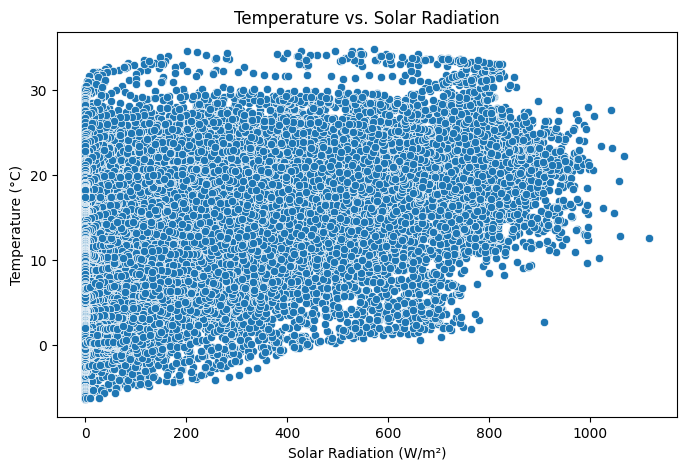

In [ ]:
plt.figure(figsize=(8, 5))
sns.scatterplot(data=df, x='SWDR', y='T')
plt.title("Temperature vs. Solar Radiation")
plt.xlabel("Solar Radiation (W/m²)")
plt.ylabel("Temperature (°C)")
plt.show()

In [ ]:
# what is this 0.01 (T vs wv)? -> no strong relationship -> no clear trend (same happens between temperature and rain!)
temperature_wv_df = df[['T', 'wv']].copy()
print(temperature_wv_df.head())

                        T    wv
date                           
2020-01-01 00:10:00  0.71  1.02
2020-01-01 00:20:00  0.75  0.43
2020-01-01 00:30:00  0.73  0.61
2020-01-01 00:40:00  0.37  1.11
2020-01-01 00:50:00  0.33  0.49


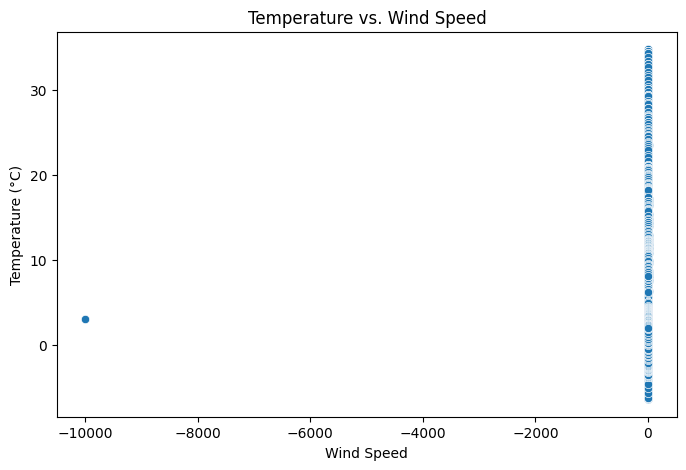

In [ ]:
plt.figure(figsize=(8, 5))
sns.scatterplot(data=df, x='wv', y='T')
plt.title("Temperature vs. Wind Speed")
plt.xlabel("Wind Speed")
plt.ylabel("Temperature (°C)")
plt.show()

In [ ]:
# outlier handling
df = df[df['wv'] > -2000] # (safe as we won't use this feature later)

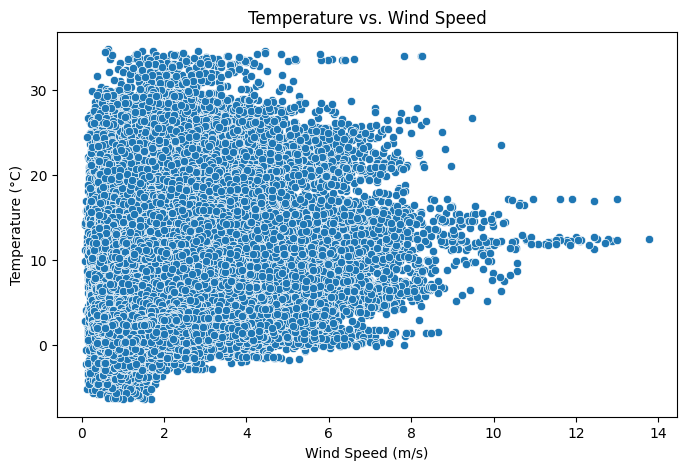

In [ ]:
plt.figure(figsize=(8, 5))
sns.scatterplot(data=df, x='wv', y='T')
plt.title("Temperature vs. Wind Speed")
plt.xlabel("Wind Speed (m/s)")
plt.ylabel("Temperature (°C)")
plt.show()

## Creation of 1H, 6H, 24H Datasets

The original dataset contains weather measurements recorded every 10 minutes over a year. To conduct analysis at different time resolutions, we aggregate the selected features into three separate datasets. These datasets contain the mean values computed over 1-hour, 6-hour and 24-hour intervals, respectively (we could also derive the 1H/6H/24H views on-the-fly via just `resample` and with no separate intermediate datasets).

In [ ]:
# helper functions (1)
def df_overview(df, name="DataFrame"):
  """
  Prints a summary of a pandas DataFrame characteristics of its shape and structure.

  Args:
      df (pd.DataFrame): Input DataFrame
      name (str, optional): Name of the DataFrame. Defaults to "DataFrame"
  """
  print(f"{name} DataFrame's shape: {df.shape}")
  print(f"Samples: {df.shape[0]}")
  print(f"Features: {df.shape[1]}")
  print(f"Feature Names: {list(df.columns)}")
  # print(f"\nData Types:\n{df.dtypes}")
  # print("Index dtype:", type(df.index))


def flatten_columns(df):
  """
  Flattens MultiIndex columns like ('T', 'mean') → 'T_mean'.

  Args:
      df: DataFrame with MultiIndex columns

  Returns:
      df: DataFrame with flattened columns
  """
  new_columns = []
  for col in df.columns:
    if isinstance(col, tuple):
      if col[1] == '':  # ('hour', '') -> 'hour' or ('six_hour_slot', '') -> 'six_hour_slot'
        new_columns.append(col[0])
      else:
        new_columns.append(f"{col[0]}_{col[1]}")
  df.columns = new_columns
  return df


def create_hourly_df(df, features, agg_func = ['mean']):
  """
  Hourly aggregation for the selected features by manually grouping by [date, hour].

  Args:
      df (pd.DataFrame): Input DataFrame containing at least 'date' and 'hour' columns,
      along with the specified feature columns
      features (list of str): List of feature column names to aggregate
      agg_func (list or str, optional): Aggregation function(s) to apply to each feature (e.g. 'mean', 'max', 'min' or a list of such functions). Defaults to ['mean']

  Returns:
      pd.DataFrame: Hourly aggregated DataFrame with a DatetimeIndex
  """
  # step 1: group by date and hour - result has MultiIndex on (hour, date)
  stats = df.groupby([df.index.date, df['hour']])[features].agg(agg_func)
  # print(stats)
  # print(stats.index)
  # print(type(stats.index))  # should be MultiIndex

  # step 2: flatten MultiIndex columns (e.g. ('T', 'mean') → 'T_mean')
  stats = flatten_columns(stats)
  # print(stats)

  # step 3: convert MultiIndex (date, hour) to normal columns for reconstruction
  stats = stats.reset_index()
  # print(stats)
  stats = stats.rename(columns={'level_0': 'date'})  # rename level_0 to date

  # step 4: create a full datetime from date and hour
  stats['datetime'] = pd.to_datetime(stats['date']) + pd.to_timedelta(stats['hour'], unit='h')
  # print(stats)

  # step 5: set datetime as index and drop date and hour columns
  stats = stats.set_index('datetime')
  stats = stats.drop(columns=['date', 'hour'])
  # print(stats)
  # print(stats.index)
  # print(type(stats.index))  # should be DatetimeIndex

  return stats


def create_six_hour_df(df, features, agg_func=['mean']):
  """
  6-hour aggregation for the selected features by manually grouping by [date, six-hour slot] where slot is in {0,1,2,3}.

  Args:
      df (pd.DataFrame): Input DataFrame containing at least 'date' and 'six_hour_slot' columns, along with the specified feature columns
      features (list of str): List of feature column names to aggregate
      agg_func (list or str, optional): Aggregation function(s) to apply to each feature (e.g. 'mean', 'max', 'min' or a list of such functions). Defaults to ['mean']

  Returns:
      pd.DataFrame: 6-hour aggregated DataFrame with a DatetimeIndex
  """
  # step 1: group by date and hour - result has MultiIndex on (six hour slot, date)
  stats = df.groupby([df.index.date, df['six_hour_slot']])[features].agg(agg_func)
  # print(stats)
  # print(stats.index)
  # print(type(stats.index))  # should be MultiIndex

  # step 2: flatten MultiIndex columns (e.g. ('T', 'mean') → 'T_mean')
  stats = flatten_columns(stats)
  # print(stats)

  # step 3: reset MultiIndex to get 'date' and 'slot' as columns
  stats = stats.reset_index()
  # print(stats)
  stats = stats.rename(columns={'level_0': 'date'})  # rename level_0 to date

  # step 4: reconstruct datetime by: date + slot * 6 hours
  stats['datetime'] = pd.to_datetime(stats['date']) + pd.to_timedelta(stats['six_hour_slot'] * 6, unit='h')
  # print(stats)

  # step 5: set datetime as index and drop helper columns
  stats = stats.set_index('datetime')
  stats = stats.drop(columns=['date', 'six_hour_slot'])
  # print(stats)
  # print(stats.index)
  # print(type(stats.index))  # should be DatetimeIndex

  return stats


def create_resampled(df, features, freq="1h", agg=("mean",)):
  """
  Downsamples to freq ('1H', '6H', 'D') and aggregates features. Assumes df has a DatetimeIndex.
  """
  if not isinstance(df.index, pd.DatetimeIndex):
    raise ValueError("df must have a DatetimeIndex.")

  # map features -> agg functions
  agg_map = {f: list(agg) if isinstance(agg, (list, tuple)) else agg for f in features}
  out = df[features].resample(freq).agg(agg_map)
  out = flatten_columns(out)  # helps when ['mean', 'max', 'sum',..]
  out.index.name = "datetime"

  # include missing time measurements
  # out = out.asfreq(freq)

  # Drop rows with NaN values after resampling.
  # Note: Even if the original dataframe `df` shows 0 missing values, the resampling step can
  # create new NaNs when an hourly (or daily) bin has no raw measurements to aggregate.
  # For example, in our dataset `df.isnull().sum()` returned 0, but after resampling to 1H
  # we observed 1 NaN in `hourly_df` because there was at least one hour with no available data.
  # Using `dropna()` here ensures that such empty bins are removed so downstream analyses
  # (ADF test, ACF/PACF, AR models, etc.) won’t break on unexpected NaNs.
  out = out.dropna()

  return out


def plot_corr_heatmap(df, title_prefix=""):
  """
  Plots a correlation heatmap for the numeric columns of a DataFrame.

  Args:
      df (pd.DataFrame): Input DataFrame.
      title_prefix (str): Text to prepend to the heatmap title (e.g., '1H', '6H', 'Daily').
  """
  corr_matrix = df.corr()
  plt.figure(figsize=(10, 5))
  sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm')
  plt.title(f"{title_prefix} Correlation Heatmap")
  plt.show()


def plot_time_features(stats, group_col='hour', title_prefix="Hourly"):
  """
  Plots per-time-group summaries (box, line, bar) for the selected features.

  Args:
      stats: DataFrame with datetime index and flat columns (e.g. 'T_mean', 'wv_mean', ...)
      group_col: Time component to group by ('hour', 'slot', or 'date')
      title_prefix: Label for plot titles (e.g. "Hourly", "6-Hour", "Daily")
  """
  # extract grouping var from datetime index
  if group_col == 'hour':
      group_values = stats.index.hour
  elif group_col == 'date':
      group_values = stats.index.date
  elif group_col == 'slot':  # used for six-hour grouping
      group_values = stats.index.hour // 6
  else:
      raise ValueError("group_col must be one of: 'hour', 'slot', 'date'")

  # define features to plot
  features = [
      ('T_mean', 'Temperature'),
      ('wv_mean', 'Wind Velocity'),
      ('SWDR_mean', 'SWDR'),
      ('rh_mean', 'Humidity'),
      ('rain_mean', 'Rainfall')
    ]

  # create a plot layout: 5 rows (features) × 3 columns (plot types: box, line, bar)
  rows = len(features)
  fig, axes = plt.subplots(nrows=rows, ncols=3, figsize=(20, 4*rows))
  fig.suptitle(f"{title_prefix} Feature Distributions and Trends", fontsize=18)

  # dataframe for plotting
  df_plot = stats.copy()
  df_plot['group'] = group_values

  for i, (col, label) in enumerate(features):

    # box plot (skip if 'Daily': too many unique dates)
    if title_prefix != "Daily":
      sns.boxplot(ax=axes[i, 0], x='group', y=col, data=df_plot)
      axes[i, 0].set_title(f"Average {label} - Box Plot")
    else:
      axes[i, 0].axis('off')  # hide subplot

    # line chart
    group_avg = df_plot.groupby('group')[col].mean() # group by the column named 'hour' or 'slot' or 'date' defined above, e.g. compute the mean for all records in each hour
    sns.lineplot(ax=axes[i, 1], x=group_avg.index, y=group_avg.values)
    # axes[i, 1].plot(group_avg.index, group_avg.values, marker='o')
    axes[i, 1].set_title(f"Average {label} - Line Chart")

    # bar chart (skip if 'Daily': too many unique dates)
    if title_prefix != "Daily":
      sns.barplot(ax=axes[i, 2], x=group_avg.index, y=group_avg.values)
      # axes[i, 2].bar(group_avg.index, group_avg.values)
      axes[i, 2].set_title(f"Average {label} - Bar Chart")
    else:
      axes[i, 2].axis('off')  # hide subplot

    # common settings (labels on x, y axes)
    for ax in axes[i]:
      ax.set_xlabel(group_col.capitalize())
      ax.set_ylabel(label)
      ax.grid(True)

  plt.tight_layout(rect=[0, 0.03, 1, 0.95])
  plt.show()

### 1H Dataset

In [ ]:
# create 1H dataset (from scratch and using resample)
# hourly_df = create_hourly_df(df, features)  # manually creation
hourly_df = create_resampled(df, features, freq="1h", agg=("mean",))
# print(list(hourly_df.columns))
# print(type(hourly_df.index))  # is DatetimeIndex
print("\n", hourly_df.head(25)) # put 25 to notice the first hour of the second day at the end


                        T_mean   wv_mean   SWDR_mean    rh_mean  rain_mean
datetime                                                                 
2020-01-01 00:00:00  0.578000  0.732000    0.000000  86.020000        0.0
2020-01-01 01:00:00  0.141667  0.781667    0.000000  87.600000        0.0
2020-01-01 02:00:00 -0.153333  0.510000    0.000000  88.583333        0.0
2020-01-01 03:00:00 -0.615000  0.908333    0.000000  89.783333        0.0
2020-01-01 04:00:00 -1.416667  1.008333    0.000000  91.500000        0.0
2020-01-01 05:00:00 -2.203333  0.965000    0.000000  93.416667        0.0
2020-01-01 06:00:00 -2.666667  0.783333    0.000000  94.583333        0.0
2020-01-01 07:00:00 -2.550000  0.878333    0.000000  94.283333        0.0
2020-01-01 08:00:00 -2.935000  0.795000    9.725000  94.266667        0.0
2020-01-01 09:00:00 -2.930000  0.833333  112.980000  93.166667        0.0
2020-01-01 10:00:00 -1.383333  0.586667  249.093333  87.166667        0.0
2020-01-01 11:00:00 -0.585000  1.196

In [ ]:
# shape and structure
df_overview(hourly_df, "1H")

1H DataFrame's shape: (8784, 5)
Samples: 8784
Features: 5
Feature Names: ['T_mean', 'wv_mean', 'SWDR_mean', 'rh_mean', 'rain_mean']


In [ ]:
# basic hourly_df information
hourly_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8784 entries, 2020-01-01 00:00:00 to 2021-01-01 00:00:00
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   T_mean     8784 non-null   float64
 1   wv_mean    8784 non-null   float64
 2   SWDR_mean  8784 non-null   float64
 3   rh_mean    8784 non-null   float64
 4   rain_mean  8784 non-null   float64
dtypes: float64(5)
memory usage: 411.8 KB


In [ ]:
# summary statistics
hourly_df.describe() # less rows due to aggregation

,T_mean,wv_mean,SWDR_mean,rh_mean,rain_mean
count,8784.000000,8784.000000,8784.000000,8784.000000,8784.000000
mean,10.817710,2.185607,131.347876,72.486849,0.011771
std,7.461108,1.525229,210.063427,19.152849,0.093870
min,-6.176667,0.198333,0.000000,21.900000,0.000000
25%,4.581250,1.037917,0.000000,58.700000,0.000000
50%,10.230833,1.780833,5.214167,75.409167,0.000000
75%,16.172083,2.873333,188.080833,87.704167,0.000000
max,34.286667,12.573333,928.368333,100.000000,3.700000


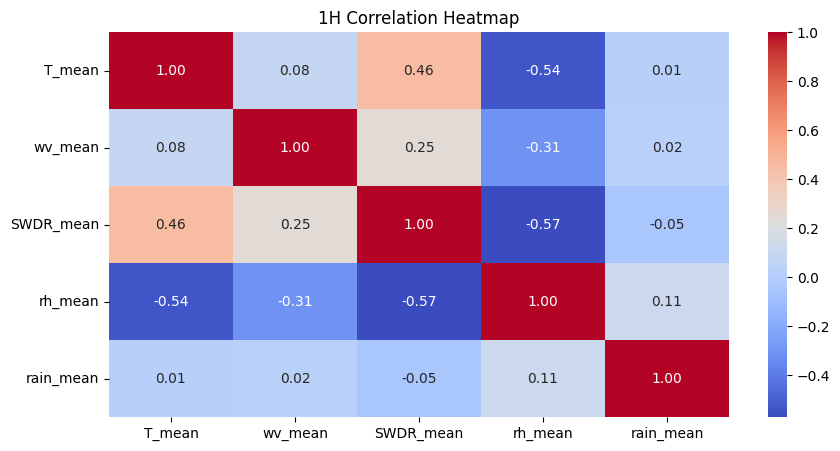

In [ ]:
# correlation
plot_corr_heatmap(hourly_df,  title_prefix="1H")  # (hourly relations between the features follow the same pattern as above T vs. SWDR, T vs. rh and T vs. wv)

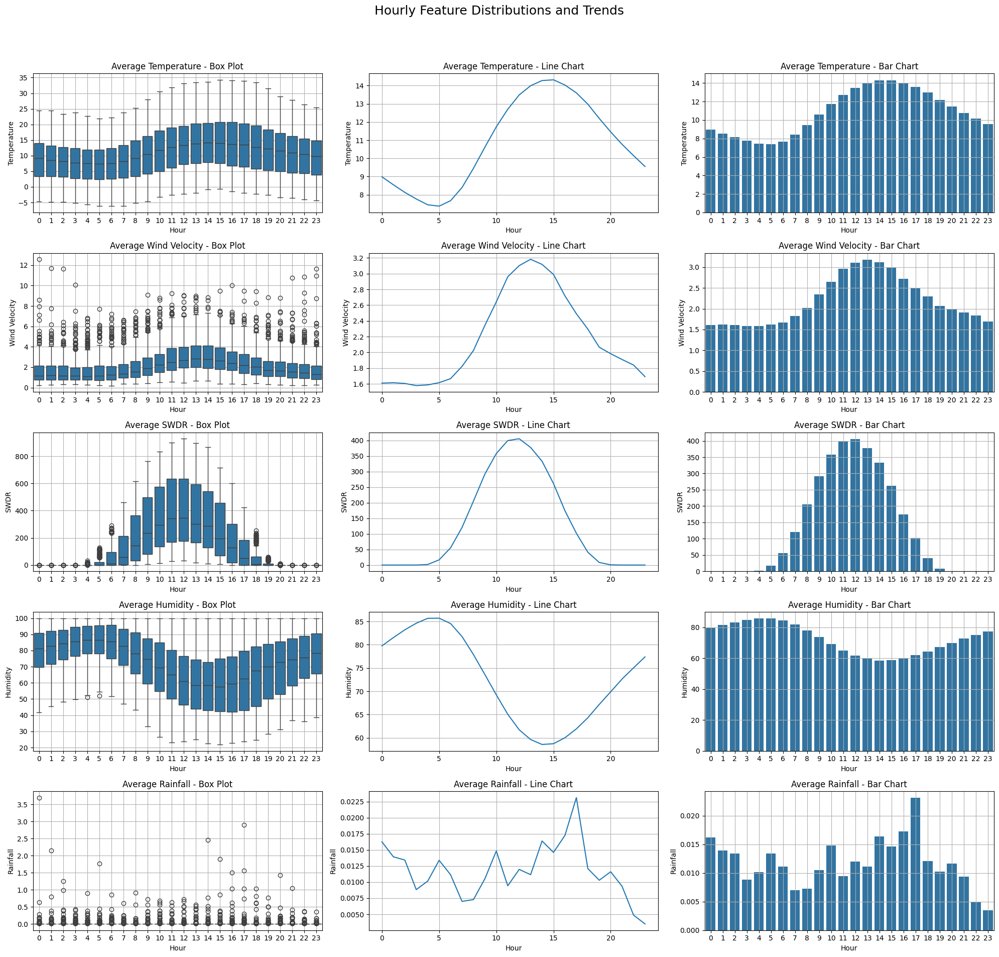

In [ ]:
# visualize feature distributions and trends
plot_time_features(hourly_df)

### 6H Dataset

In [ ]:
# create 6-hour-slot dataframe with flattened columns and DatetimeIndex
# six_hour_df = create_six_hour_df(df, features)  # manually creation
six_hour_df = create_resampled(df, features, freq="6h", agg=("mean",))
print(six_hour_df.head())

                       T_mean   wv_mean   SWDR_mean    rh_mean  rain_mean
datetime                                                                 
2020-01-01 00:00:00 -0.645429  0.820000    0.000000  89.582857        0.0
2020-01-01 06:00:00 -2.175000  0.845556  111.938333  91.461111        0.0
2020-01-01 12:00:00  2.909167  0.863611  117.253611  73.938611        0.0
2020-01-01 18:00:00 -2.149167  0.605000    0.000000  90.822222        0.0
2020-01-02 00:00:00 -4.601944  0.700000    0.000000  90.966667        0.0


In [ ]:
# shape and structure
df_overview(six_hour_df, "6H")

6H DataFrame's shape: (1465, 5)
Samples: 1465
Features: 5
Feature Names: ['T_mean', 'wv_mean', 'SWDR_mean', 'rh_mean', 'rain_mean']


In [ ]:
# basic six_hour_df information
six_hour_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1465 entries, 2020-01-01 00:00:00 to 2021-01-01 00:00:00
Freq: 6h
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   T_mean     1465 non-null   float64
 1   wv_mean    1465 non-null   float64
 2   SWDR_mean  1465 non-null   float64
 3   rh_mean    1465 non-null   float64
 4   rain_mean  1465 non-null   float64
dtypes: float64(5)
memory usage: 68.7 KB


In [ ]:
# summary statistics
six_hour_df.describe()

,T_mean,wv_mean,SWDR_mean,rh_mean,rain_mean
count,1465.000000,1465.000000,1465.000000,1465.000000,1465.000000
mean,10.812703,2.184754,131.307079,72.492235,0.011763
std,7.304318,1.353301,182.785627,18.045346,0.059241
min,-5.008056,0.395833,0.000000,24.381389,0.000000
25%,4.645278,1.177500,0.093056,59.575556,0.000000
50%,10.375833,1.806389,30.667222,74.872222,0.000000
75%,16.205278,2.846111,204.568889,86.605556,0.000000
max,33.527778,9.603611,700.097778,100.000000,1.200000


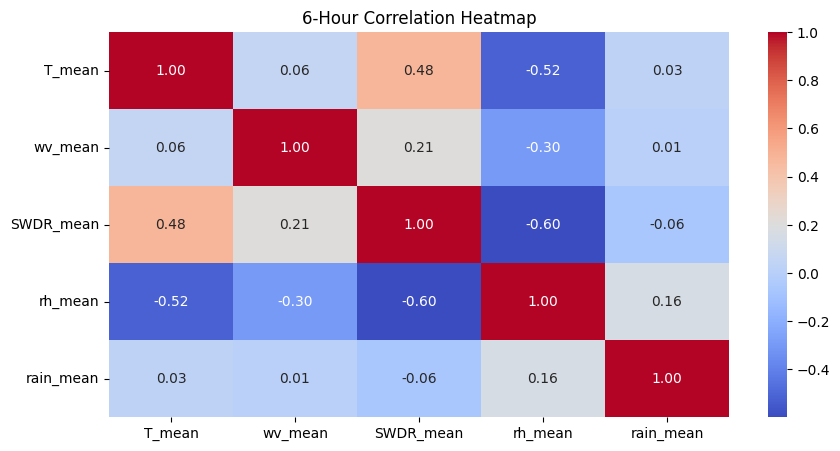

In [ ]:
# correlation
plot_corr_heatmap(six_hour_df, title_prefix="6-Hour") # (six hour relations between the features follow the same pattern as original data and hourly data T vs. SWDR, T vs. rh and T vs. wv)

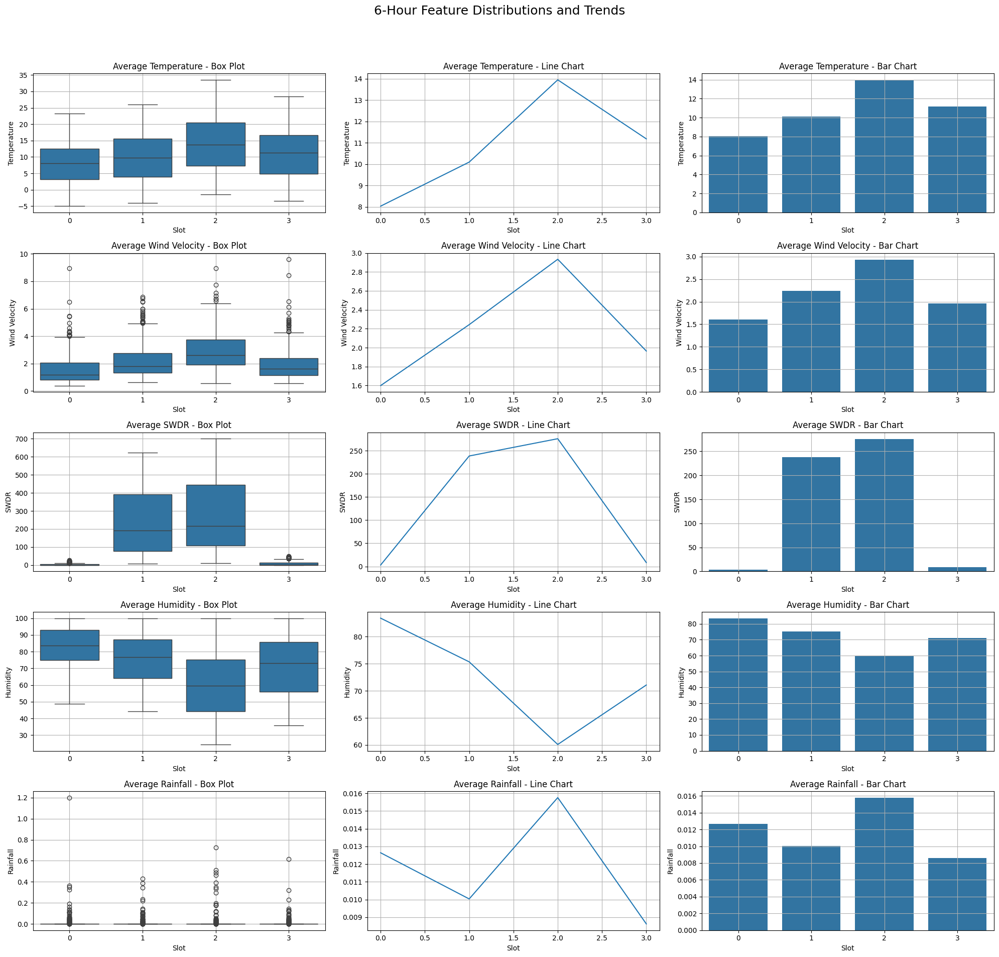

In [ ]:
# visualize feature distributions and trends
plot_time_features(six_hour_df, group_col='slot', title_prefix="6-Hour")

### 24H Dataset

In [ ]:
# create daily dataframe with flattened columns and DatetimeIndex
daily_df = create_resampled(df, features, freq="D", agg=("mean",))
print(daily_df.head())

              T_mean   wv_mean  SWDR_mean    rh_mean  rain_mean
datetime                                                       
2020-01-01 -0.514196  0.783287  57.698671  86.429301   0.000000
2020-01-02 -1.056319  1.173403  66.461389  80.206042   0.000000
2020-01-03  4.835278  3.927153  11.569375  81.975000   0.002083
2020-01-04  3.784931  2.261667   8.040208  80.899861   0.033333
2020-01-05  2.735000  1.791528  31.750208  76.422639   0.000000


In [ ]:
# shape and structure
df_overview(daily_df, "Daily")

Daily DataFrame's shape: (367, 5)
Samples: 367
Features: 5
Feature Names: ['T_mean', 'wv_mean', 'SWDR_mean', 'rh_mean', 'rain_mean']


In [ ]:
# basic daily_df information
daily_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 367 entries, 2020-01-01 to 2021-01-01
Freq: D
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   T_mean     367 non-null    float64
 1   wv_mean    367 non-null    float64
 2   SWDR_mean  367 non-null    float64
 3   rh_mean    367 non-null    float64
 4   rain_mean  367 non-null    float64
dtypes: float64(5)
memory usage: 17.2 KB


In [ ]:
# summary statistics
daily_df.describe()

,T_mean,wv_mean,SWDR_mean,rh_mean,rain_mean
count,367.000000,367.000000,367.000000,367.000000,367.000000
mean,10.794986,2.181415,131.004021,72.510000,0.011740
std,6.718472,1.041204,94.265102,13.978738,0.037388
min,-2.705417,0.570000,0.000000,43.658750,0.000000
25%,4.836076,1.454549,46.727222,61.169688,0.000000
50%,10.582153,1.882847,97.954861,72.993194,0.000000
75%,16.074028,2.706215,212.652500,83.360451,0.005556
max,26.869375,6.453403,344.564028,100.000000,0.322222


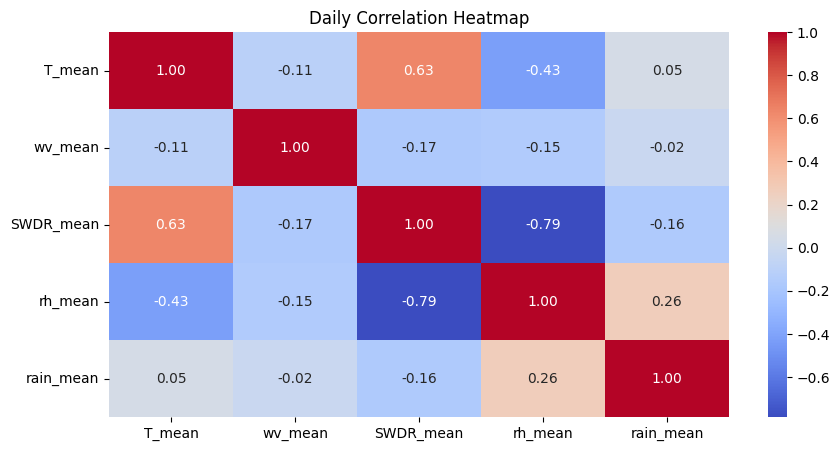

In [ ]:
# correlation
plot_corr_heatmap(daily_df, title_prefix="Daily") # (notice the daily relations between the features changed here -> inverse of what we had above for T vs. SWDR, T vs. rh and T vs. wv)

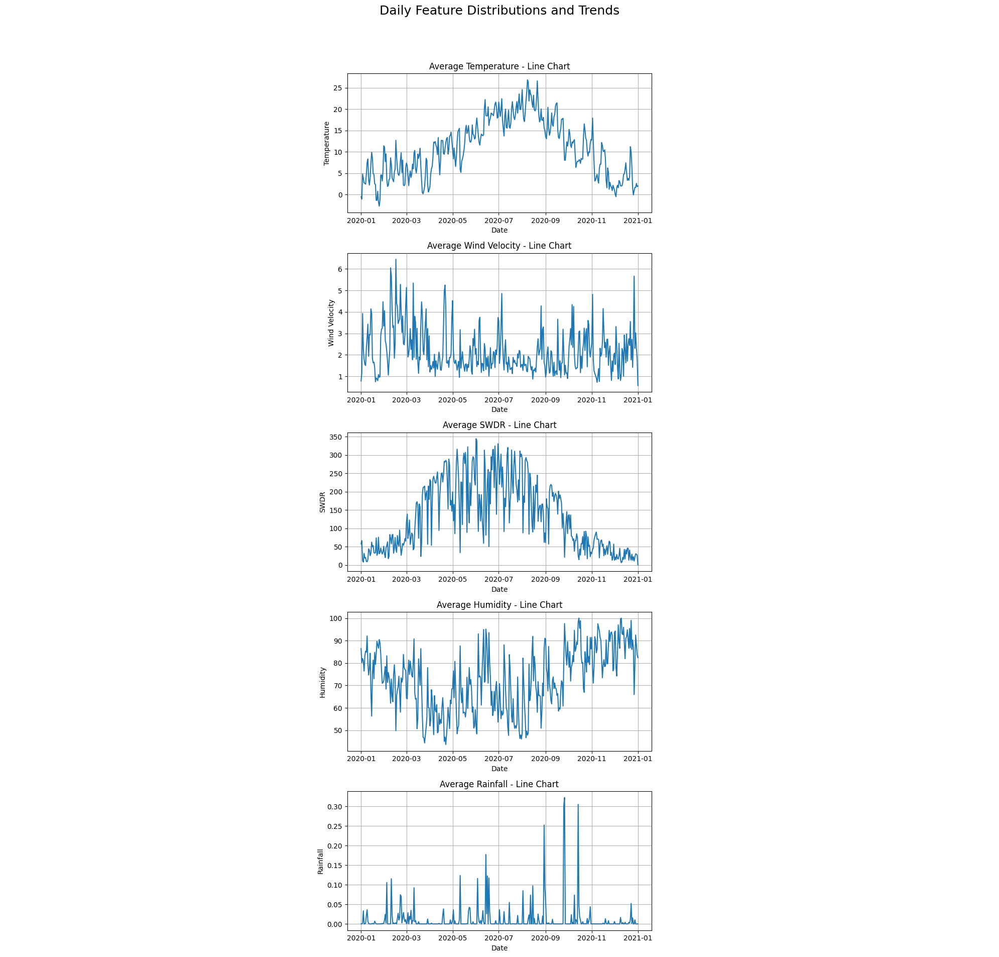

In [ ]:
# visualize feature distributions and trends
plot_time_features(daily_df, group_col='date', title_prefix="Daily")

## Exploring Time Series Properties

We take a first visual look at the main time-series properties (**trend**, **seasonality**, **cyclic behavior** and **residuals**) for all selected features. This is a soft, exploratory inspection aimed at spotting obvious patterns, while a more detailed and formal time-series analysis will follow next.

In [ ]:
def plot_hourly_vs_daily_trends(hourly_df, daily_df):
  """
  Plots hourly (mean by hour-of-day) and daily lines for key weather features.
  Left: first 4 days and average over hour-of-day (0–23). Right: daily timeline.

  Args:
      hourly_df: DataFrame with hourly-aggregated data (DatetimeIndex)
      daily_df: DataFrame with daily-aggregated data (DatetimeIndex)
  """
  # define features to plot
  features = [
      ('T_mean', 'Temperature'),
      ('wv_mean', 'Wind Velocity'),
      ('SWDR_mean', 'SWDR'),
      ('rh_mean', 'Humidity'),
      ('rain_mean', 'Rainfall')
  ]

  # create the len(features)×2 plot grid
  fig, axes = plt.subplots(nrows=len(features), ncols=3, figsize=(20, 15))
  fig.suptitle("Hourly Vs. Daily Line Trends", fontsize=18)

  # precompute hour-of-day groups (extract the 'hour' part of the Datetime index col)
  hour_of_day = hourly_df.index.hour

  for i, (col, label) in enumerate(features):

    # 4-day hourly: line of first 4 days
    ax = axes[i, 0]
    ax.plot(hourly_df.index[:96], hourly_df[col][:96].values, marker='o')
    ax.set_title(f"Hourly {label} - First 4 Days")
    ax.set_xlabel("Days")
    ax.set_ylabel(label)
    ax.grid(True)

    # display days in x-axis and set ticks
    ax.xaxis.set_major_locator(mdates.HourLocator(interval=24))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))

    # set vertical ticks every 24H
    ticks = pd.date_range(start=hourly_df.index[0], end=hourly_df.index[96], freq='24h')
    ax.set_xticks(ticks)
    for tick in ticks:
      ax.axvline(x=tick, color='gray', linestyle='--')

    # hourly: average by hour-of-day (0...23)
    ax = axes[i, 1]
    hourly_avg = hourly_df.groupby(hour_of_day)[col].mean()
    ax.plot(hourly_avg.index, hourly_avg.values, marker='o')
    ax.set_title(f"Hourly Avg {label}")
    ax.set_xlabel("Hour")
    ax.set_ylabel(label)
    ax.grid(True)

    # daily: line across dates for the current col (feature)
    ax = axes[i, 2]
    ax.plot(daily_df.index, daily_df[col].values, color='orange')
    ax.set_title(f"Daily {label}")
    ax.set_xlabel("Date")
    ax.set_ylabel(label)
    ax.grid(True)

  # # rotate date labels, if needed
  # fig.autofmt_xdate()

  plt.tight_layout(rect=[0, 0.03, 1, 0.95])
  plt.show()

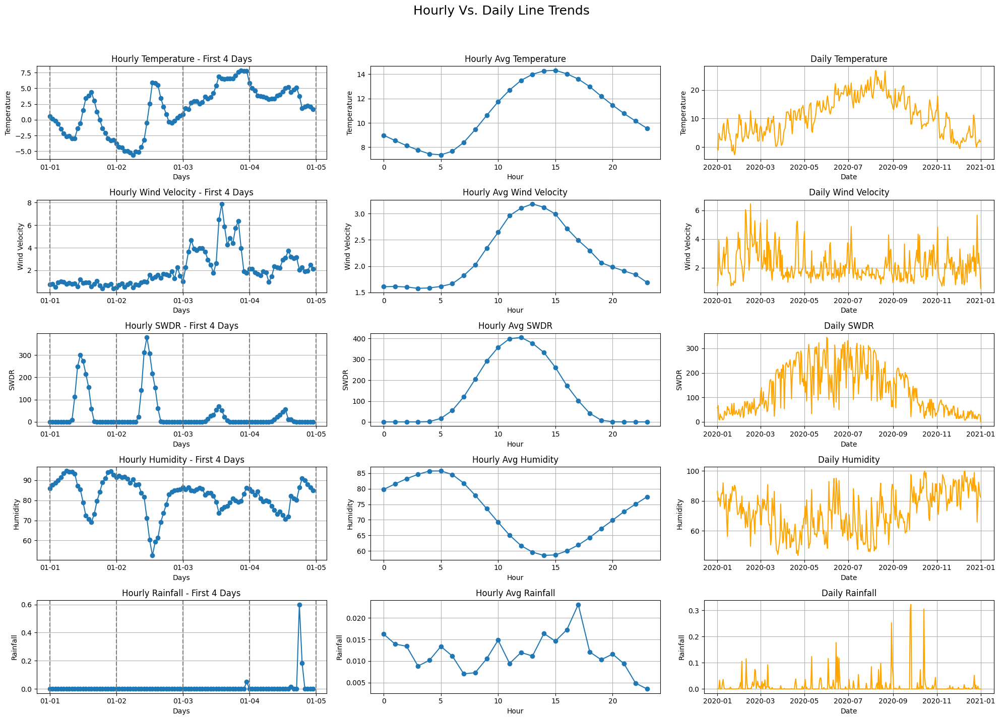

In [ ]:
# visual comparison of short-term (hourly) and long-term (daily) patterns for the selected features
plot_hourly_vs_daily_trends(hourly_df, daily_df)

**Analyzing Time-Series Properties**

From the plots, we can visually inspect the key properties (trend, seasonality, cyclic behavior, and residuals) for all selected features. Residual behavior is not always obvious in these plots, so we will examine it in the next step.

It is important to note that seasonality refers to patterns that repeat at fixed intervals (e.g. every 24 hours or every year), while cyclic behavior refers to longer-term patterns that repeat but not on a strict schedule and may vary in duration or intensity.

*   **Temperature**
  *   Trend: It increases during the day and decreases at night, while across the year it rises toward summer and falls in winter.
  *   Seasonality: A 24-hour cycle is visible in the first plot, and the daily data follows a clear annual pattern (temperatures start lower in January, climb to a peak in mid-summer, then fall back toward winter again).
  *   Cyclic: We only observe fixed-period seasonalities (daily and yearly), so no cyclic behavior here.

*   **Wind Velocity**
  *   Trend: Tends to increase in the late morning and afternoon, then decrease overnight. Across the year, no clear long-term upward or downward trend is visible.
  *   Seasonality: A weak daily pattern is visible in the second plot, but the daily data does not show a consistent annual pattern.
  *   Cyclic: Only a slight daily seasonality is present, but no broader cyclic behavior is observed.

*   **SWDR (Solar Radiation)**
  *   Trend: Peaks sharply around midday each day and follows a strong seasonal rise toward summer, then a decline toward winter.
  *   Seasonality: We observe a clear daily pattern and an annual pattern driven by changes in sunlight intensity and day length.
  *   Only fixed daily and yearly seasonalities are observed, no cyclic behavior is present.

*   **Humidity**
  *   Trend: Generally higher during the night and early morning, decreasing through the day, with no strong long-term annual trend.
  *   Seasonality: Clear daily pattern that is approximately inverse to temperature, while annual pattern is weaker and less consistent.
  *   Cyclic: Only fixed daily seasonality is observed, no cyclic behavior is present.

*   **Rainfall**
  *   Trend: No clear daily or long-term trend as rainfall events occur sporadically.
  *   Seasonality: No consistent daily or annual seasonal pattern as rainfall appears irregular.
  *   Cyclic: No cyclic behavior observed, variability is driven by isolated weather events.

Taking into account the above plots of the selected features, we will use the ones that show strong evidence in most of the properties such as **temperature**, **SWDR** and **humidity**. These will later be tested in the modeling stage.

Residuals are what remains from a time series after removing its trend and seasonality components. Let's quickly see now what remains from the original time series if we drop the trend (and later we will explore this in more detail).

In [ ]:
def compute_residuals(df, col, window):
  """
  Computes trend (rolling mean) and residuals for a single column.

  Args:
      df : DataFrame with DatetimeIndex
      col : column name (string) to process
      window : int, rolling window size
  Returns:
      trend : Series of rolling mean
      residuals : Series = original - trend
  """
  trend = df[col].rolling(window=window, center=True, min_periods=1).mean()
  residuals = df[col] - trend
  return trend, residuals

def plot_original_trend_residual(df, col, trend, residuals, title_prefix=""):
  """
  Plots Original, Trend and Residual time series.

  Args:
      df : DataFrame with DatetimeIndex
      col : column name (string) to process
      trend : Series of rolling mean
      residuals : the computed residuals of series of df (Series = original - trend)
      title_prefix : label for plot titles
  """
  fig, axes = plt.subplots(1, 3, figsize=(20, 5))

  axes[0].plot(df.index, df[col], label='Original')
  axes[0].set_title(f"{title_prefix} - Original")
  axes[0].grid(True)

  axes[1].plot(trend.index, trend, color='orange', label='Trend')
  axes[1].set_title(f"{title_prefix} - Trend")
  axes[1].grid(True)

  axes[2].plot(residuals.index, residuals, color='green', label='Residual')
  axes[2].set_title(f"{title_prefix} - Residual")
  axes[2].grid(True)

  for ax in axes:
    ax.set_xlabel("Date")
    ax.set_ylabel("Average Temperature")
    ax.legend()

  plt.tight_layout()
  plt.show()

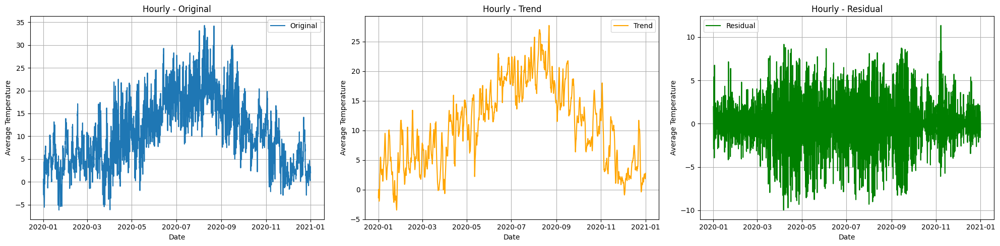

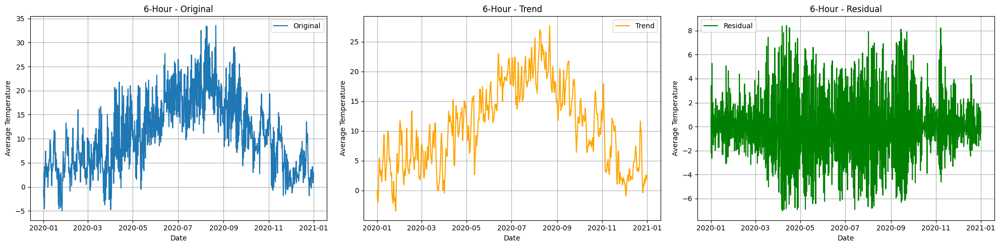

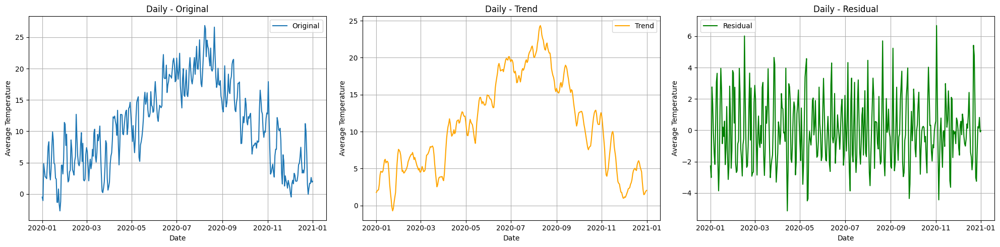

In [ ]:
# visualize residuals
time_resolutions_residuals = [
    (hourly_df, "Hourly", 24), # ~1 day window
    (six_hour_df, "6-Hour", 4), # ~1 day window (4×6h slots -> 1 day)
    (daily_df, "Daily", 7) # ~1 week window
    ]

# temperature residuals
for df, name, win in time_resolutions_residuals:
  trend, resid = compute_residuals(df, 'T_mean', window=win)
  plot_original_trend_residual(df, 'T_mean', trend, resid, title_prefix=name)

In [ ]:
# SWDR residuals
# for df, name, win in time_resolutions_residuals:
#   trend, resid = compute_residuals(df, 'SWDR_mean', window=win)
#   plot_original_trend_residual(df, 'SWDR_mean', trend, resid, title_prefix=name)

In [ ]:
# humidity residuals
# for df, name, win in time_resolutions_residuals:
#   trend, resid = compute_residuals(df, 'rh_mean', window=win)
#   plot_original_trend_residual(df, 'rh_mean', trend, resid, title_prefix=name)

In [ ]:
def analyze_extreme_events(df, heatwave_threshold=25):
  """
  Simple extreme weather analysis for daily data with columns: T_mean (avg temp), wv_mean (wind), rain_mean (rainfall).
  Assumes DatetimeIndex with daily frequency.
  """
  # find extremes and their dates
  hottest_day = df['T_mean'].idxmax()
  coldest_day = df['T_mean'].idxmin()
  windiest_day = df['wv_mean'].idxmax()
  rainiest_day = df['rain_mean'].idxmax()

  highest_hum_day = df['rh_mean'].idxmax()
  lowest_hum_day = df['rh_mean'].idxmin()

  highest_swdr_day = df['SWDR_mean'].idxmax()
  lowest_swdr_day = df['SWDR_mean'].idxmin()

  extremes = {
      'highest_temp': (df.loc[hottest_day, 'T_mean'], hottest_day),
      'lowest_temp': (df.loc[coldest_day, 'T_mean'], coldest_day),
      # 'highest_wind': (df.loc[windiest_day, 'wv_mean'], windiest_day),
      # 'max_daily_rain': (df.loc[rainiest_day, 'rain_mean'], rainiest_day),
      'highest_humidity': (df.loc[highest_hum_day, 'rh_mean'], highest_hum_day),
      'lowest_humidity': (df.loc[lowest_hum_day, 'rh_mean'], lowest_hum_day),
      'highest_swdr': (df.loc[highest_swdr_day, 'SWDR_mean'], highest_swdr_day),
      'lowest_swdr': (df.loc[lowest_swdr_day, 'SWDR_mean'], lowest_swdr_day)
  }

  # longest heatwave detection
  heatwave_days = 0
  max_heatwave_days = 0
  start_date = None
  heatwave_start = None
  heatwave_end = None
  prev_date = None

  for date, tmp in df['T_mean'].items():
    if tmp > heatwave_threshold:
      if heatwave_days == 0:
        start_date = date
      heatwave_days += 1
    else:
      if heatwave_days > max_heatwave_days:
        max_heatwave_days = heatwave_days
        heatwave_start = start_date
        heatwave_end = prev_date # last date abovve threshold
      heatwave_days = 0
    prev_date = date

  # update and store vars if heatwave ends
  if heatwave_days > max_heatwave_days:
    max_heatwave_days = heatwave_days
    heatwave_start = start_date
    heatwave_end = prev_date

  extremes['longest_heatwave (days)'] = max_heatwave_days
  extremes['heatwave_start'] = heatwave_start
  extremes['heatwave_end'] = heatwave_end

  # print results
  print("Extreme Weather Events:\n")
  for event, value in extremes.items():
    if isinstance(value, tuple):
      value, day = value
      print(f"{event}: {value} on {day.date()}")
    else:
      print(f"{event}: {value}")

In [ ]:
# preview some extremes of the original df
analyze_extreme_events(df)

Extreme Weather Events:

highest_temp: 26.869375 on 2020-08-08
lowest_temp: -2.7054166666666664 on 2020-01-25
highest_humidity: 100.0 on 2020-10-15
lowest_humidity: 43.65875 on 2020-04-22
highest_swdr: 344.56402777777777 on 2020-06-01
lowest_swdr: 0.0 on 2021-01-01
longest_heatwave (days): 2
heatwave_start: 2020-08-08 00:00:00
heatwave_end: 2020-08-09 00:00:00


## Time Series Analysis

### Stationarity in Time Series

A **stationary** time series has its statistical properties of the mean and variance constant over time, with no seasonality. For models like **AR**, stationarity is important because parameter estimates and forecasts rely on these stable properties, while for **NNs**, stationarity is not strictly necessary.

**Why it matters:**  
- Stable mean and variance make the model assumptions valid.  
- Non-stationary data can lead to biased or unreliable forecasts.

**How to check:**  
- **Visually:** plot the series to spot mean and variance changes and detect seasonality.  
- **Statistically:** use the [Augmented Dickey-Fuller (ADF)](https://en.wikipedia.org/wiki/Augmented_Dickey%E2%80%93Fuller_test) test.

**If non-stationary:**  
- Apply differencing (and possibly seasonal differencing) until stationarity is achieved.  
- After forecasting, reverse the differencing to restore predictions to the original scale.

In [ ]:
def plot_single_series(series, time_res, feat):
  """
  PPlots a single time series.

  Args:
      series (pd.Series): Time series data
  """
  plt.figure(figsize=(10,5))
  plt.plot(series)
  plt.xlabel('Time')
  plt.ylabel('Value')
  plt.title(f'{time_res} {feat} Time Series')
  plt.grid(True)
  plt.tight_layout()
  plt.show()


def plot_series(series, freq, feat):
  """
  Plots time series views to visually inspect stationarity (seasonality, mean and variance changes).

  Args:
      series (pd.Series): Time series with a DatetimeIndex
      freq (str): Sampling frequency: one of {"1H", "6H", "24H"}
      feat (str, optional): Feature title for the figure
  """
  freq = freq.upper()

  # determine windows (in number of points) for each frequency
  if freq == "1H":
    windows = [("Full series", len(series)), ("Last 1 day", 24), ("Last 1 week", 7 * 24)]
  elif freq == "6H":
    windows = [("Full series", len(series)), ("Last 1 day", 4), ("Last 1 week", 7 * 4)] # 4 samples per day /28 samples per week
  else:  # "24H" (daily)
    windows = [("Full series", len(series)), ("Last 1 week", 7), ("Last 1 month (30d)", 30)]

  fig, axes = plt.subplots(1, 3, figsize=(20, 5), constrained_layout=True)

  for ax, (label, npts) in zip(axes, windows):
    # slice last npts (or all)
    view = series if npts >= len(series) else series.iloc[-npts:]

    ax.plot(view.index, view.values)
    ax.set_title(label)
    ax.set_xlabel("Time")
    ax.set_ylabel(series.name if series.name else "value")
    ax.grid(True)

    # quick mean/std annotation to help stationarity check
    mu = pd.Series(view.values).mean()
    sd = pd.Series(view.values).std()
    ax.text(0.02, 0.95, f"mean={mu:.2f}\nstd={sd:.2f}",
            transform=ax.transAxes, va="top", ha="left",
            bbox=dict(boxstyle="round", alpha=0.15, lw=0))

  fig.suptitle( f"Visual Stationarity Check ({freq}) for {feat}", fontsize=14)
  plt.show()

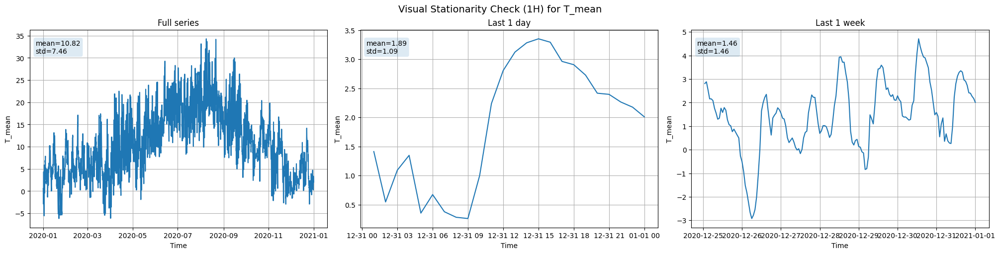

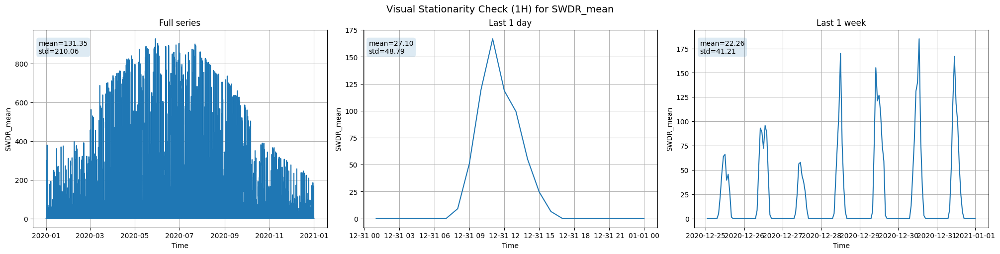

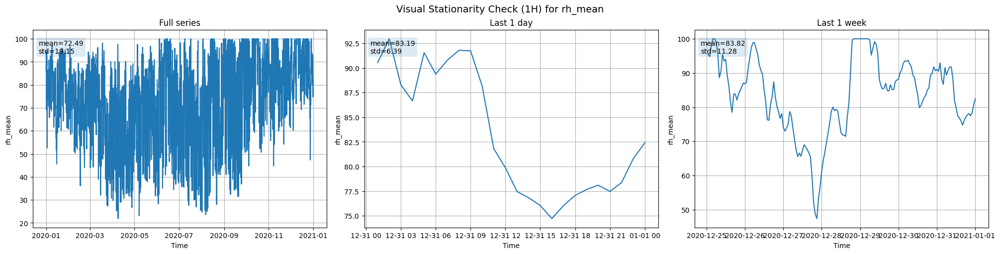

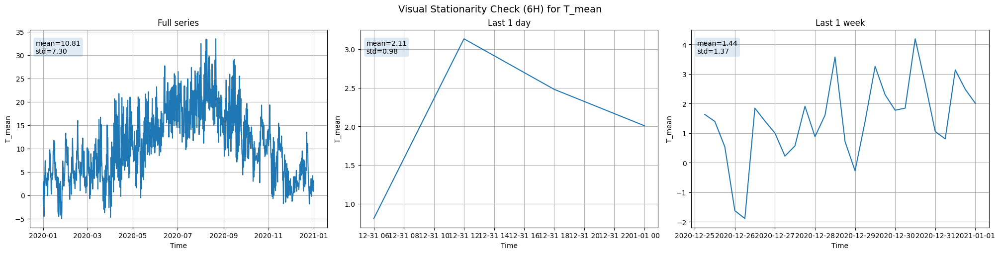

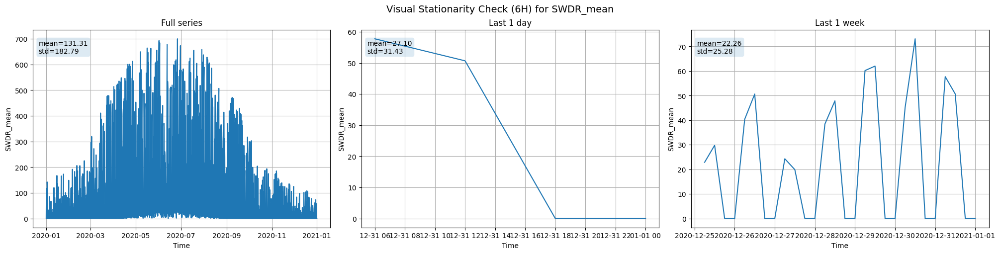

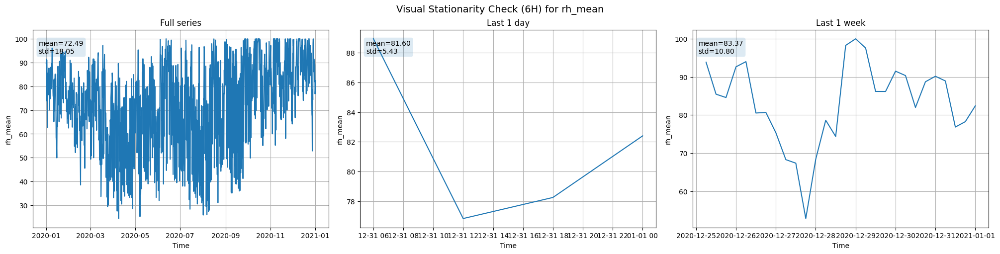

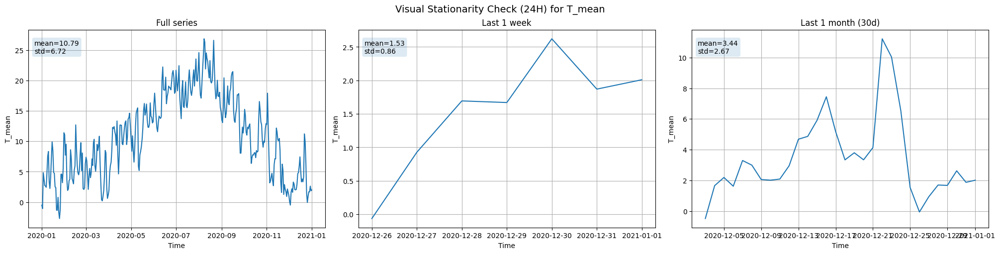

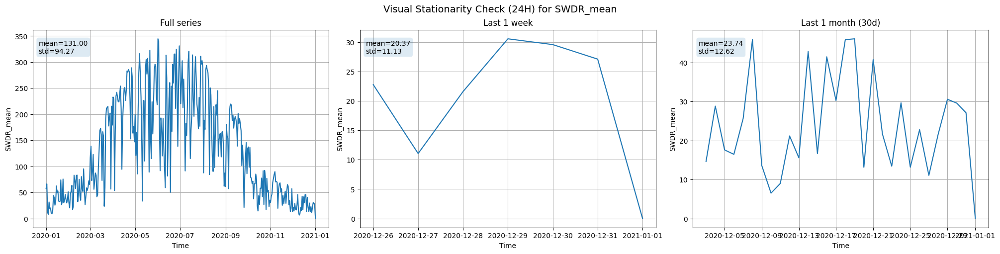

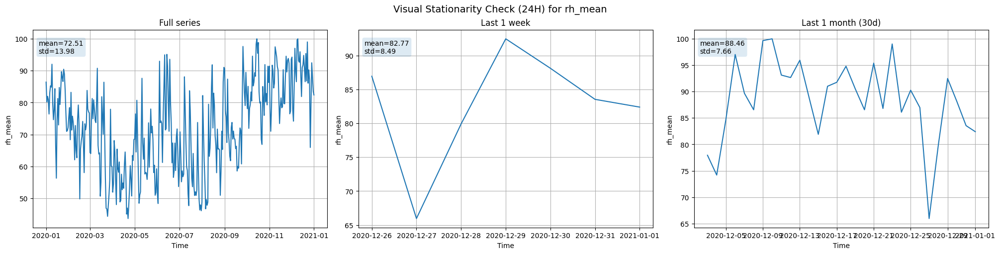

In [ ]:
final_selected_features = ['T_mean', 'SWDR_mean', 'rh_mean']

# check stationarity visually
for freq, df in [('1H', hourly_df), ('6H', six_hour_df), ('24H', daily_df)]:
  for col in final_selected_features:
    if col in df.columns:
      plot_series(df[col], freq, f'{col}')

**Quick stationarity check**

*   1H time series
  - Mean: Not constant for T_mean (winter/summer level shifts), SWDR_mean (day/night shifts) and rh_mean.  
  - Variance: Changes over time for T_mean (larger spread in warmer periods), SWDR_mean (near-zero at night vs. large daytime spikes -> strong variable spread), and rh_mean (see week scale changes).  
  - Seasonality: Clear daily cycle for T_mean and SWDR_mean, while rh_mean has weaker pattern (generally moving opposite to temperature).

  Conclusion: All three are non-stationary.  

*   6H time series
  - Mean: Not constant for T_mean and SWDR_mean and rh_mean.   
  - Variance: Changes over time for all three features, T_mean (bigger spread mid-year), SWDR_mean (near-zero at night vs tall daytime peaks), rh_mean (week-to-week swings).   
  - Seasonality: Daily patterns for T_mean and SWDR_mean, weaker for rh_mean.

  Conclusion: All three are non-stationary.

*   24H time series
  - Mean: Not constant for all three features.  
  - Variance: Not constant for all three features.  
  - Seasonality: Yearly pattern for T_mean and SWDR_mean, weaker for rh_mean (daily cycle is hidden at daily sampling).

  Conclusion: All three are non-stationary.

Notes:

*   Reagarding seasonality visibility for all cases, the full-series plot can hide repeating patterns because of trend and noise. When we zoom to a week (or a day/month), the cycles become much clearer.
*   rh_mean is close tostationary, as if its variance were steadier, we could call it stationary.

In [ ]:
def test_stationarity(time_series, time_res, feat):
  """
  Performs stationarity check for the input time series by examining rolling statistics and applying the Augmented Dickey-Fuller (ADF) test.

  Args:
      time_series (pd.Series): Time series data
      time_res (str): Resolution label (e.g. '1H', '6H', '24H')
      feat (str): Feature title for the figure
  """
  time_series = pd.Series(time_series) # enure input is pandas series
  time_series = time_series.dropna()  # ensure no Nans
  # plot rolling statistics
  # ts_mean = time_series.rolling().mean()
  # ts_std = time_series.rolling().std()

  # plt.figure(figsize=(12, 6))
  # plt.plot(time_series, label='Original')
  # plt.plot(ts_mean, label='Rolling Mean')
  # plt.plot(ts_std, label='Rolling Std')
  # plt.legend(loc='best')
  # plt.title(f'Rolling Mean & Standard Deviation for {time_res} for {feat}')
  # plt.show()

  # ADF test
  print(f"Results of Dickey-Fuller Test for {time_res} {feat}:")
  dftest = adfuller(time_series)  # , autolag='AIC'
  # print(f"ADF Statistic: {dftest[0]}")
  # print(f"p-value: {dftest[1]}")
  # print(f"Number of lags used: {dftest[2]}")
  # print(f"Number of observations used: {dftest[3]}")
  if dftest[1] <= 0.05:
    print("The time series is stationary\n")
  else:
    print("The time series is non-stationary\n")

In [ ]:
# check stationarity using adf test
for freq, df in [('1H', hourly_df), ('6H', six_hour_df), ('24H', daily_df)]:
  print(f"Full Series ADF Stationarity check\n")
  for col in final_selected_features:
    if col in df.columns:
      test_stationarity(df[col], time_res=freq, feat=col)

Full Series ADF Stationarity check

Results of Dickey-Fuller Test for 1H T_mean:
The time series is stationary

Results of Dickey-Fuller Test for 1H SWDR_mean:
The time series is stationary

Results of Dickey-Fuller Test for 1H rh_mean:
The time series is stationary

Full Series ADF Stationarity check

Results of Dickey-Fuller Test for 6H T_mean:
The time series is non-stationary

Results of Dickey-Fuller Test for 6H SWDR_mean:
The time series is non-stationary

Results of Dickey-Fuller Test for 6H rh_mean:
The time series is stationary

Full Series ADF Stationarity check

Results of Dickey-Fuller Test for 24H T_mean:
The time series is non-stationary

Results of Dickey-Fuller Test for 24H SWDR_mean:
The time series is non-stationary

Results of Dickey-Fuller Test for 24H rh_mean:
The time series is stationary



Based on ADF, 1H series look stationary, while at 6H/24H, T_mean and SWDR_mean are non-stationary, and rh_mean is stationary. We will difference only where needed.

**Why differencing sequences ensures stationarity**

We start from the **AR(1)** model with: $x_t = b_1\,x_{t-1} + b_0 + e_t$

The first difference is: $x_{t+1} - x_t$

From the definition: $x_{t+1} = b_1\,x_t + b_0 + e_{t+1}$

Subtracting $x_t$ from both sides: $x_{t+1} - x_t = \big( b_1\,x_t + b_0 + e_{t+1} \big) - x_t$

This becomes: $\Delta x_t = x_{t+1} - x_t = (b_1 - 1)\,x_t + b_0 + e_{t+1}$

To check stationarity of the first difference, we define mean and variance:

$E[\Delta x_t] = (\beta-1)\,E[x_t] + b_0$

$\mathrm{Var}(\Delta x_t) = (\beta-1)^2\,\mathrm{Var}(x_t) + \sigma_e^2 \quad$ (see more [here](https://en.wikipedia.org/wiki/Autoregressive_model))

- For $|b_1| < 1$ we have:
  - $E[x_t] = \dfrac{b_0}{1-\beta}, \quad \mathrm{Var}(x_t) = \dfrac{\sigma_e^2}{1-\beta^2}$

  - $E(\Delta x_t) = 0, \mathrm{Var}(\Delta x_t)=\dfrac{2\,\sigma_e^2}{1+\beta}$ => both are constant ⇒ **stationary**.

- For $|b_1| = 1, \Delta x_t = x_{t+1} - x_t = b_0 + e_{t+1}$ and we have:

  $E[\Delta x_t] = b_0, \quad \mathrm{Var}(\Delta x_t) = \sigma_e^2$
  
  This is white noise with constant mean and constant variance ⇒ **stationary**.

- For $|b_1| > 1$, the original $x_t$ is *explosive*, so $(b_1 - 1)\,x_t$ blows up and the mean is not constant ⇒ **non-stationary**.

In [ ]:
def difference_series(series, lag=1):
  """
  Applies first-order or seasonal differencing to a time series.

  Args:
    series (array-like): The time series values
    lag (int): The lag to use for differencing (default=1):
        - lag = 1 -> first-order differencing (diff_t = x_t - x_{t-1})
        - lag > 1 -> seasonal differencing (subtracts the value from `lag` steps earlier: diff_t = x_t - x_{t-L})

  Returns
    pdSeries: Differenced series (NaNs removed)
  """
  # diff_values = []
  # for i in range(lag, len(series)):
  #   diff = series[i] - series[i-lag]
  #   diff_values.append(diff)

  diff2 = pd.Series(series).diff(lag).dropna()
  # print("All are the equal") if np.array_equal(np.array(diff_values), diff2) else print("There is a mistake, do it again!")
  return diff2

def inverse_difference(history, diff_series, lag=1):
  """
  Reconstructs original-scale values from a differenced series.

  Args:
     history (int or float): The last original value right before the first element of `diff_series`
       - lag = 1 -> last value just before the diff_series first element (x_t = diff_t + x_{t-1})
       - lag = L -> last L-th value before the first element of 'diff_series' (x_t = diff_t + x_{t-L})
     diff_series (array-like): The differenced values to invert (e.g. model outputs on differenced data)
     lag (int): The differencing lag used to create `diff_series` (default=1)

  Returns:
    np.ndarray: Restored values in the original scale, same length as `diff_series`

  Examples:
    # First-order differencing (lag=1)
    # y = [10, 12, 15, 17, 20]  -> diffs = [2, 3, 2, 3]
    # inverse_difference([y[0]], diffs, lag=1) -> [12., 15., 17., 20.]

    # Seasonal differencing (lag=3)
    # y = [5, 8, 7, 9, 11, 10], diffs (L=3) = y[L:] - y[:-L] = [(9-5), (11-8), (10-7)] = [4, 3, 3]
    # y[:L] = [5, 8, 7]  (the last L before the diffs)
    # inverse_difference(history, diffs, lag=L) -> [9., 11., 10.]
  """
  # create a list keeping only the last `lag` values, For first iter, it's the input, for the second iter, it's the producing new element
  hist = list(history[-lag:])
  restored = []

  for d in diff_series:

    val = d + hist[-lag]  # add the lagged original value to the difference value (x_t = Δx_t + x_{t-lag})

    restored.append(val)
    hist.append(val) # update the history with the newly restored value
    if len(hist) > lag: # keep a moving window of size `lag`
      hist = hist[1:]

  return np.array(restored)

In [ ]:
# a dummy example of first order differencing (lag=1) and inversing
x_test_series = hourly_df["T_mean"][:8].reset_index(drop=True)
print("Original series:\n", x_test_series.tolist())
print("Shape of original series:", x_test_series.shape, "\n")
test_stationarity(x_test_series, time_res='1H', feat='T_mean')

diff_x_test = difference_series(x_test_series, lag=1)
print("Differenced series:\n", diff_x_test.tolist())
print("Shape of series with differences:", diff_x_test.shape, "\n")
test_stationarity(diff_x_test, time_res='1H', feat='T_mean')

restored_x_test = inverse_difference([x_test_series[0]], diff_x_test, lag=1)
print("Restored series:\n", restored_x_test.tolist())
print("Shape of restored series:", restored_x_test.shape, "\n")
test_stationarity(restored_x_test, time_res='1H', feat='T_mean')

# example of correctness of inverse
print("Are they correctly restored?\n", np.allclose(restored_x_test, x_test_series[1:]))

Original series:
 [0.5780000000000001, 0.14166666666666666, -0.15333333333333335, -0.615, -1.4166666666666667, -2.203333333333333, -2.6666666666666665, -2.5500000000000003]
Shape of original series: (8,) 

Results of Dickey-Fuller Test for 1H T_mean:
The time series is non-stationary

Differenced series:
 [-0.4363333333333334, -0.29500000000000004, -0.46166666666666667, -0.8016666666666667, -0.7866666666666664, -0.4633333333333334, 0.11666666666666625]
Shape of series with differences: (7,) 

Results of Dickey-Fuller Test for 1H T_mean:
The time series is stationary

Restored series:
 [0.14166666666666666, -0.15333333333333338, -0.615, -1.4166666666666667, -2.203333333333333, -2.6666666666666665, -2.5500000000000003]
Shape of restored series: (7,) 

Results of Dickey-Fuller Test for 1H T_mean:
The time series is stationary

Are they correctly restored?
 True


In [ ]:
# a dummy example of seasonal differencing (lag=3) and inversing
print("Original series:\n",  x_test_series.tolist())
print("Shape of original series:",  x_test_series.shape, "\n")
test_stationarity(x_test_series, time_res='1H', feat='T_mean')

lag = 3
sdiff_x_test = difference_series(x_test_series, lag=lag)
print(f"Differenced series for (lag={lag}):\n", sdiff_x_test.tolist())
print("Shape of series with differences:", sdiff_x_test.shape, "\n")
test_stationarity(sdiff_x_test, time_res='1H', feat='T_mean')

srestored_x_test = inverse_difference(x_test_series[:lag], sdiff_x_test, lag=lag)
print(f"Restored series (for lag={lag}):\n", srestored_x_test.tolist())
print("Shape of restored series:", srestored_x_test.shape, "\n")
test_stationarity(srestored_x_test, time_res='1H', feat='T_mean')

# correctness check
print("Are they correctly restored?\n", np.allclose(srestored_x_test, x_test_series[lag:]))

Original series:
 [0.5780000000000001, 0.14166666666666666, -0.15333333333333335, -0.615, -1.4166666666666667, -2.203333333333333, -2.6666666666666665, -2.5500000000000003]
Shape of original series: (8,) 

Results of Dickey-Fuller Test for 1H T_mean:
The time series is non-stationary

Differenced series for (lag=3):
 [-1.193, -1.5583333333333333, -2.05, -2.0516666666666667, -1.1333333333333335]
Shape of series with differences: (5,) 

Results of Dickey-Fuller Test for 1H T_mean:
The time series is non-stationary

Restored series (for lag=3):
 [-0.615, -1.4166666666666667, -2.203333333333333, -2.666666666666667, -2.5500000000000003]
Shape of restored series: (5,) 

Results of Dickey-Fuller Test for 1H T_mean:
The time series is non-stationary

Are they correctly restored?
 True


In [ ]:
# check for NaNs
# print(hourly_df.isna().sum())
# print(six_hour_df.isna().sum())
# print(daily_df.isna().sum())

# create the time series
T_mean_1H = hourly_df["T_mean"]
# print(t_1h_series.head())
T_mean_6H = six_hour_df["T_mean"]
T_mean_24H = daily_df["T_mean"]

SWDR_mean_1H = hourly_df["SWDR_mean"]
SWDR_mean_6H = six_hour_df["SWDR_mean"]
SWDR_mean_24H = daily_df["SWDR_mean"]

RH_mean_1H = hourly_df["rh_mean"]
RH_mean_6H = six_hour_df["rh_mean"]
RH_mean_24H = daily_df["rh_mean"]

# create differenced time series only for non-stationary series
T_mean_6H_diff = difference_series(T_mean_6H)
T_mean_24H_diff = difference_series(T_mean_24H)
SWDR_mean_6H_diff = difference_series(SWDR_mean_6H)
SWDR_mean_24H_diff = difference_series(SWDR_mean_24H)

# all_series as all stationary series of the final selected features
all_series = [T_mean_1H, T_mean_6H_diff, T_mean_24H_diff, SWDR_mean_1H, SWDR_mean_6H_diff, SWDR_mean_24H_diff, RH_mean_1H, RH_mean_6H, RH_mean_24H]

# keep labels for reference
all_series_labels = [
    ("1H",  "T_mean"),
    ("6H",  "T_mean_diff"),
    ("24H", "T_mean_diff"),
    ("1H",  "SWDR_mean"),
    ("6H",  "SWDR_mean_diff"),
    ("24H", "SWDR_mean_diff"),
    ("1H",  "RH_mean"),
    ("6H",  "RH_mean"),
    ("24H", "RH_mean")
]

In [ ]:
# shapes check
print(T_mean_6H.shape, T_mean_6H_diff.shape)

(1465,) (1464,)


In [ ]:
# re-check stationarity for all_series
for ts, (time_res, feat) in zip(all_series, all_series_labels):
  test_stationarity(ts, time_res=time_res, feat=feat)

Results of Dickey-Fuller Test for 1H T_mean:
The time series is stationary

Results of Dickey-Fuller Test for 6H T_mean_diff:
The time series is stationary

Results of Dickey-Fuller Test for 24H T_mean_diff:
The time series is stationary

Results of Dickey-Fuller Test for 1H SWDR_mean:
The time series is stationary

Results of Dickey-Fuller Test for 6H SWDR_mean_diff:
The time series is stationary

Results of Dickey-Fuller Test for 24H SWDR_mean_diff:
The time series is stationary

Results of Dickey-Fuller Test for 1H RH_mean:
The time series is stationary

Results of Dickey-Fuller Test for 6H RH_mean:
The time series is stationary

Results of Dickey-Fuller Test for 24H RH_mean:
The time series is stationary



Since differencing successfully rendered all series stationary, no further steps such as volatility or seasonality removal are required.

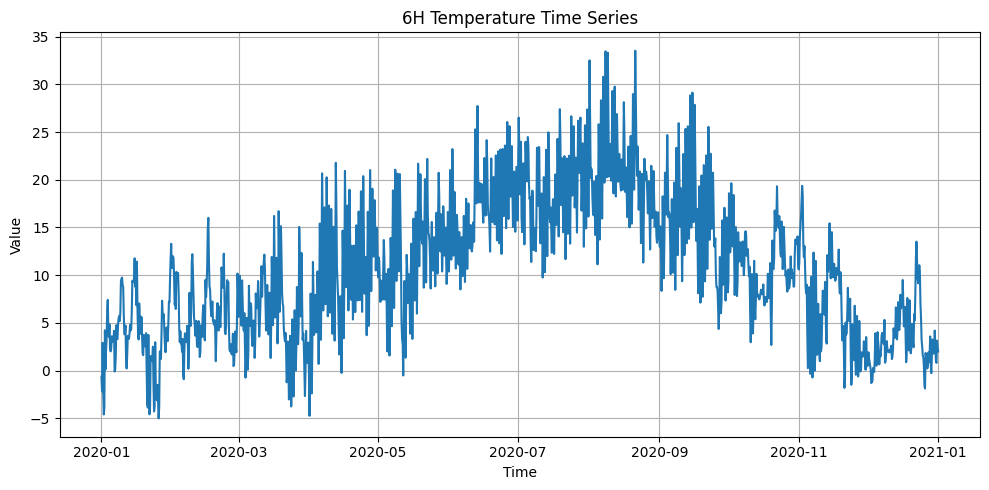

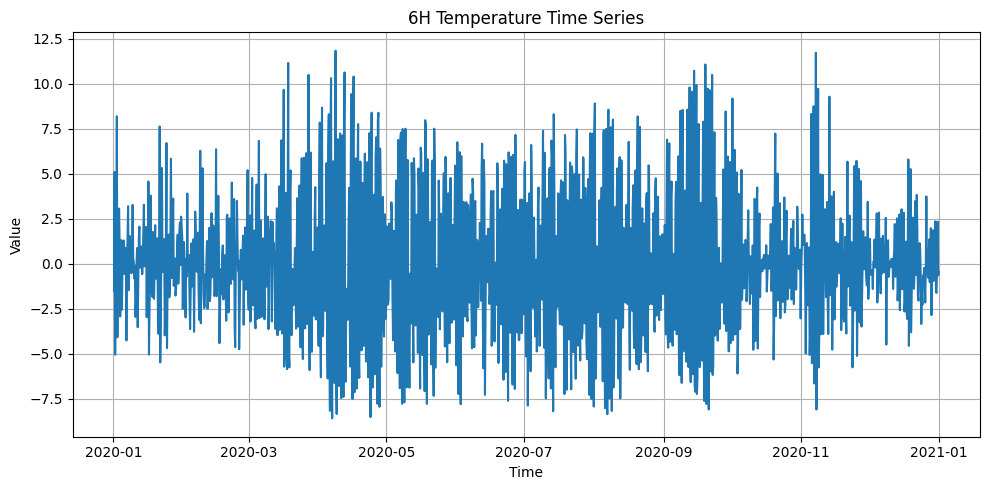

In [ ]:
# plots of original vs differenced series
plot_single_series(T_mean_6H, "6H", "Temperature")
plot_single_series(T_mean_6H_diff, "6H", "Temperature")

### Autocorrelation and Partial Autocorrelation

In time series, the value at a given timestep $t$ can depend directly on the previous value $(
t-1)$ or on multiple earlier values through indirect autocorrelations $(t-4, t-24)$ in addition to the direct correlation at $(t-1)$. For example, the temperature at 12:00 am **may** depend not only on the value at 11:00 am but also on the value 24 hours earlier at 12:00 am the previous day. In contrast, this kind of long-term dependency may not appear in other weather features, such as rainfall. Since time series, in our case, have a finite length, a key question is: **how many past steps should be considered, and which ones are most relevant?** To answer this, we use the **Autocorrelation Function (ACF)**, which captures both direct and indirect dependencies, and the **Partial Autocorrelation Function (PACF)**, which isolates the direct effects only.

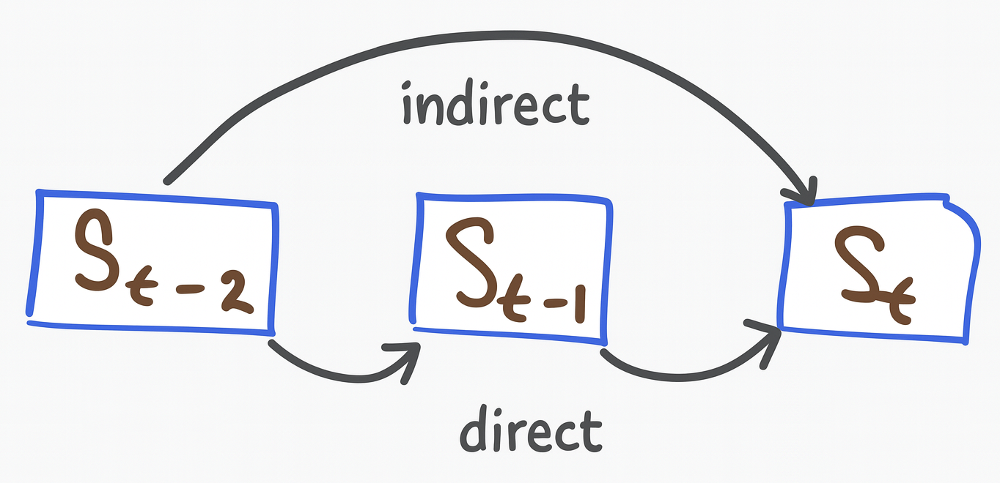

In [ ]:
def correlation_plots(series, title, max_lags=50):
  """
  Plots autocorrelation (ACF) and partial autocorrelation (PACF) plots for a given time series.

  Args:
      series (pd.Series or array-like): Time series data
      title (str): Title for the plot
      max_lags (int): Maximum number of lags to include in the plots
  """
  fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

  # plot ACF
  plot_acf(series, lags=max_lags, ax=axes[0])
  axes[0].set_title(f'{title} - ACF')

  # plot PACF
  plot_pacf(series, lags=max_lags, ax=axes[1])
  axes[1].set_title(f'{title} - PACF')

  plt.tight_layout()
  plt.show()

  # print(type(series), series.shape)
  # print("na:", series.isna().sum())
  # print(series.head())
  # print("nunique:", series.nunique())

Different time series can depend on a different number of past values, so the choice of how many lags to include is not the same for all cases. For example, we created series for three features (temperature, radiation, humidity) at multiple resolutions, because in a multivariate setting these could be combined in a VAR model to predict temperature. Here, however, we use the ACF and PACF plots of each stationary series for the feature of **temperature** to guide us in deciding how many past timesteps (lags) to include in the AR baseline.

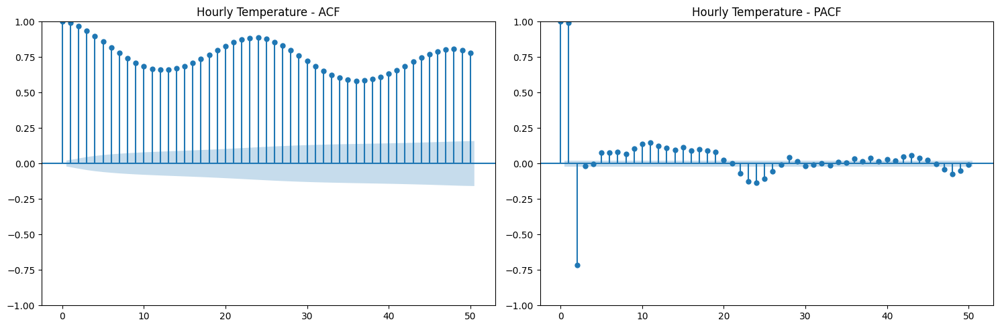

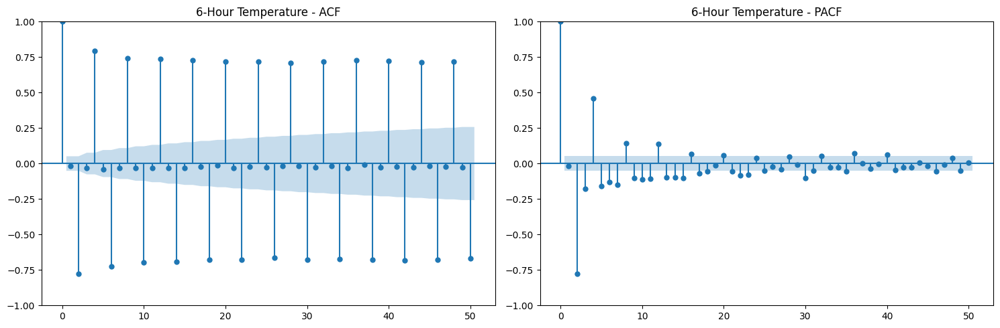

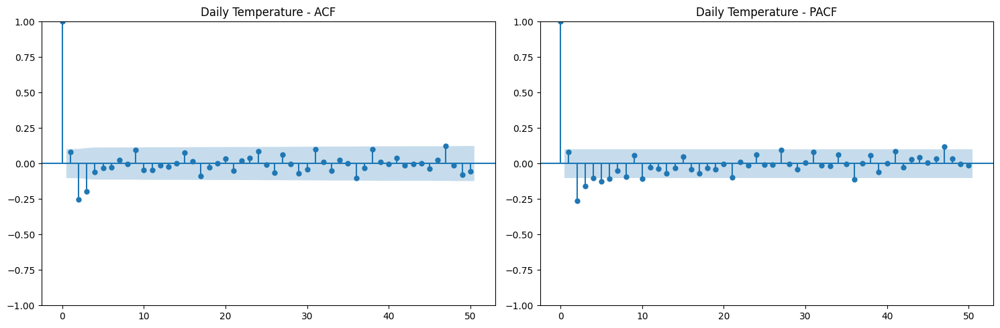

In [ ]:
# loop through all stationary series and plot ACF/PACF
# for ts, (time_res, feat) in zip(all_series, all_series_labels):
#   # ensure tehre are no NaNs
#   ts = pd.Series(ts).dropna()

#   title = f"{feat} ({time_res})"
#   correlation_plots(ts, title)

# plots of ACF/PACF only for temperature
correlation_plots(T_mean_1H, 'Hourly Temperature')
correlation_plots(T_mean_6H_diff, '6-Hour Temperature')
correlation_plots(T_mean_24H_diff, 'Daily Temperature')

In the ACF/PACF plots, lags that fall inside the blue confidence bands are not statistically significant, while those outside indicate real dependency.

In the ACF plots, the 1H and 6H temperature series show many lags outside the confidence bands, indicating strong dependence on past values, which is reasonable given the smooth hourly evolution of temperature. In contrast, the daily series has only the first few lags outside the bands, suggesting that dependencies weaken quickly and each day is influenced mainly by the previous one or two days. Overall, the slow decay of the ACF in the 24H series points to an AR process, while the 1H and 6H series exhibit strong periodic correlations rather than a simple decay, indicating influence not only from the immediate past but also from seasonal lags (probably a seasonal AR approach). For further evidence, we see at the PACF plots.

In the PACF plots, the 1H temperature series shows many significant lags up to around 24, reflecting both short-term dependence and a daily periodic effect. The 6H series likewise exhibits several significant lags (up to about 14), indicating that recent 6-hour intervals remain influential. In the 24H series only the first few lags (up to 5) stand out, after which values fall within the confidence bands and lose statistical significance.

Across all three resolutions, lag=1 is consistently the outside (meaning the current value depends primarily on the immediately previous timestep), which makes $AR(1)$ a natural common baseline. However, it would be also interesting to test high-order models such as $AR(24)$ for 1H series, $AR(14)$ for 6H series, or $AR(7)$ for daily series to see if they capture longer dependencies more effectively. We can then compare these alternative models using information criteria such as **AIC** and **BIC** to decide which order provides the best balance between fit and complexity. In addition, we can also test multi-lag specifications, where the model takes into account more than one previous value (e.g. $AR([1, 24])$ for hourly data), in order to capture both short-term and seasonal dependencies simultaneously.

In [ ]:
# based on PACF, the following lag sets are plausible candidates to test
cand_lags_1H  = [
    [1], # common baseline
    [24], # daily seasonality
    [1, 2], # more short-term
    [1, 2, 14], # short-long memory
    [1, 2, 14, 24]  # add more short-long memory
]

cand_lags_6H = [
    [1], # baseline
    [4], # one day at 6H resolution (4 steps)
    [1, 4], # short-term + daily
    [1, 2, 4, 12], # short-long memory
    [1, 4, 12, 16] # more short-long memory
]

cand_lags_24H = [
    [1], # baseline
    [6], # 6-day pattern
    [1, 6], # short-term + 6-day
    [1, 2, 6], # more short-term + 6-day
    [1, 2, 3, 6] # even more short-term + 6-day
]

### Normalization

We normalize the time series because the different meteorological features (e.g. temperature, humidity, radiation) are measured on different scales and ranges. Normalization brings them to a comparable range, ensuring that no single variable dominates the learning process and helping models converge faster and more stably. In our case, we mainly work on temperature, so normalization is not strictly necessary, but we apply it for consistency across experiments and because it will be beneficial when training neural networks later on.

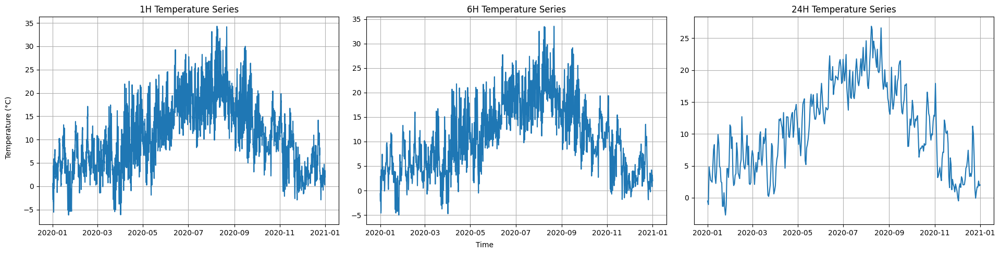

In [ ]:
# plot all (unormalized) series
fig = plt.figure(figsize=(20, 5))

plt.subplot(1, 3, 1)
plt.plot(T_mean_1H)
plt.title('1H Temperature Series')
plt.grid(True)

plt.subplot(1, 3, 2)
plt.plot(T_mean_6H)
plt.title('6H Temperature Series')
plt.grid(True)

plt.subplot(1, 3, 3)
plt.plot(T_mean_24H)
plt.title('24H Temperature Series')
plt.grid(True)

fig.text(0.5, 0.04, 'Time', ha='center')
fig.text(0.04, 0.5, 'Temperature (°C)', va='center', rotation='vertical')

plt.tight_layout(rect=[0.05, 0.05, 1, 1])
plt.show()

In [ ]:
def normalize_series(series):
  """
  Normalizes a time series using z-score normalization: x_norm = (x - mean) / std

  Args:
      series (pd.Series or np.ndarray): Input time series.

  Returns:
      pd.Series: Normalized series (mean=0, std=1).
      float: Mean of the original series (for inverse transform).
      float: Std of the original series (for inverse transform).
  """
  mean = series.mean()
  std = series.std()

  norm_series = (series - mean) / (std + 1e-8)  # avoid dividing by zero
  return norm_series, mean, std

In [ ]:
# preview a sample before normalization
x_test2 = T_mean_1H.iloc[0]
print("Unormalized sample:", x_test2)

# normalize series and preview tthe normalized sample
x_test2_norm, x_test2_mean, x_test2_std = normalize_series(T_mean_1H)
print("Normalized sample:", x_test2_norm.iloc[0])

# denormalize and display the same denormalized sample (should match with original one)
x_test2_denorm = x_test2_norm * x_test2_std + x_test2_mean
print("Denormalized sample:", x_test2_denorm.iloc[0])

Unormalized sample: 0.5780000000000001
Normalized sample: -1.3724115018660377
Denormalized sample: 0.5780000137241128


In [ ]:
# normalize all temperature series
T_mean_1H_norm, T_mean_1H_mean, T_mean_1H_std = normalize_series(T_mean_1H)

T_mean_6H_norm, T_mean_6H_mean, T_mean_6H_std = normalize_series(T_mean_6H)
T_mean_6H_norm_diff, T_mean_6H_mean_diff, T_mean_6H_std_diff = normalize_series(T_mean_6H_diff)

T_mean_24H_norm, T_mean_24H_mean, T_mean_24H_std = normalize_series(T_mean_24H)
T_mean_24H_norm_diff, T_mean_24H_mean_diff, T_mean_24H_std_diff = normalize_series(T_mean_24H_diff)

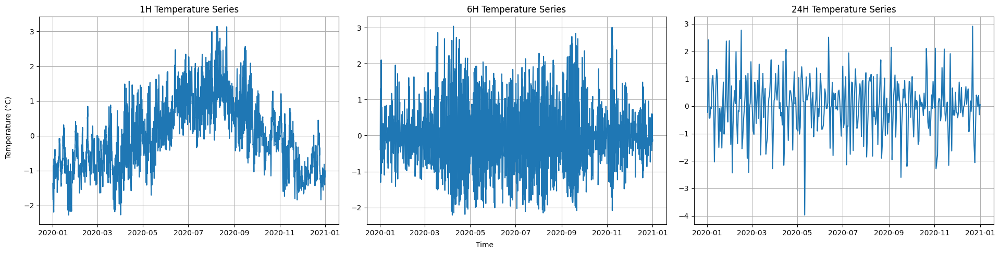

In [ ]:
# plot all (normalized) series
fig = plt.figure(figsize=(20, 5))

plt.subplot(1, 3, 1)
plt.plot(T_mean_1H_norm)
plt.title('1H Temperature Series')
plt.grid(True)

plt.subplot(1, 3, 2)
plt.plot(T_mean_6H_norm_diff) # notice stationarity
plt.title('6H Temperature Series')
plt.grid(True)

plt.subplot(1, 3, 3)
plt.plot(T_mean_24H_norm_diff)  # notice stationarity
plt.title('24H Temperature Series')
plt.grid(True)

fig.text(0.5, 0.04, 'Time', ha='center')
fig.text(0.04, 0.5, 'Temperature (°C)', va='center', rotation='vertical')

plt.tight_layout(rect=[0.05, 0.05, 1, 1])
plt.show()

Notice that the overall patterns remain unchanged as the lines look the same as before normalization. The only difference is that the values have been rescaled to a new range.

## AR Baseline Model

**Autoregressive (AR) Model**

An Autoregressive model of order $p$, denoted as $AR(p)$, is defined as:

$y_t = \phi_1 y_{t-1} + \phi_2 y_{t-2} + \dots + \phi_p y_{t-p} + \epsilon_t$

Where:
- $y_t$: the value of the time series at time $t$
- $\phi_1, \dots, \phi_p$: autoregressive coefficients
- $p$: the order of the model - the number of the past time steps used for prediction (e.g. $p=24$ means the model uses the past $24$ values)
- $\epsilon_t$: white noise error term (omitted in our implementation, its effect is reflected in the residuals)

To fit AR models and estimate autoregressive coefficients, we will use the built-in `AutoReg` implementation from the *statsmodels* library and a `custom AR` using the **Normal Equation**:

$\boldsymbol{\phi} = (X^\top X)^{-1} X^\top \mathbf{y}$, where:
- $X$: matrix of input values (with a bias column)
- $\mathbf{y}$: vector of target values
- $\boldsymbol{\phi}$: estimated coefficient vector (including the bias term)

We then compare prediction accuracy (MAE, RMSE, MAPE) and training time between the two approaches, highlighting the trade-off between a lightweight custom solution and the more general statsmodels implementation.

### Initial Order Estimation

The goal here is to try to determine which lag values to include in each AR model, meaning how many past timesteps and which specific ones should be used as predictors for the series. To do this, we test candidate lag sets suggested by visual inspection and then evaluate their performance using both statistical criteria and visual assessment (later we automate this process and compare via metrics).

In [ ]:
def fit_and_plot_ar_candidates(series, cand_lags, feat_name, time_res, n_obs=100):
  """
  Fits and plots AR models for a given series and candidate lags.

  Args:
      series (pd.Series): Time series data (stationary and normalized)
      cand_lags (list): List of candidate lag sets (e.g. [[1], [24], [1,24]])
      feat_name (str): Feature name for titles (e.g. "T_mean")
      time_res (str): Time resolution string (e.g. "1H", "6H", "24H")
      n_obs (int): Number of initial observations to plot

  Returns:
      dict: Dictionary of fitted AR models keyed by candidate index
  """
  # make index freq-aware
  # series = series.sort_index()
  # series.index = pd.to_datetime(series.index)
  series = series.asfreq(time_res.lower())
  series = series.interpolate()

  # fit and plot
  fitted_models = {}
  plt.figure(figsize=(12, len(cand_lags) * 3))

  for idx, lags in enumerate(cand_lags):
    ar_model = AutoReg(series, lags=lags, old_names=False)
    ar_fit = ar_model.fit()
    fitted_models[tuple(lags)] = ar_fit
    plt.subplot(len(cand_lags), 1, idx+1)
    plt.plot(series[:n_obs], label="Original")
    plt.plot(ar_fit.fittedvalues[:n_obs], label="Fitted")
    plt.title(f"{feat_name} ({time_res}) – AR({', '.join(map(str, lags))})")
    plt.legend()

  plt.tight_layout()
  plt.show()

  return fitted_models

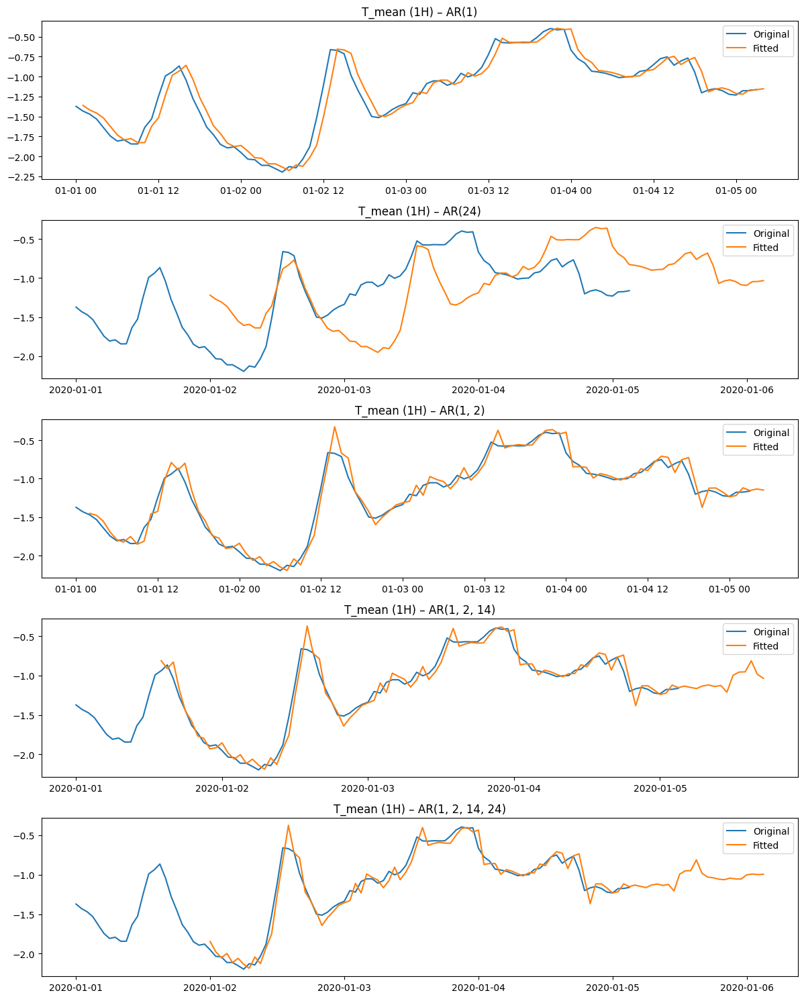

In [ ]:
# 1H ARs
fitted_models_1H = fit_and_plot_ar_candidates(T_mean_1H_norm, cand_lags_1H, feat_name="T_mean", time_res="1H")

In [ ]:
# 6H ARs
# fitted_models_6H = fit_and_plot_ar_candidates(T_mean_6H_norm_diff, cand_lags_6H, feat_name="T_mean", time_res="6H")

In [ ]:
# 24H ARs
# fitted_models_24H = fit_and_plot_ar_candidates(T_mean_24H_norm_diff, cand_lags_24H, feat_name="T_mean", time_res="24H")

Observations from the visual checks:

1H: $AR(1)$ already follows the short-term variations closely, $AR(24)$ moves away and adding lags like $(1,2), (1,2,14), (1,2,14,24)$ looks slightly closer at spots, although they add complexity without clear gain.

For 6H/24H cases, we can follow the same workflow. Generally, adding lags can improve fit, but it also increases parameters and training time. Because the fitted lines are often visually very similar, we rely on [AIC/BIC](https://medium.com/@jshaik2452/choosing-the-best-model-a-friendly-guide-to-aic-and-bic-af220b33255f) (typically favoring BIC's stronger penalty) to choose the simplest order that still explains the data well.

**AIC/BIC to evaluate lag sets**

Each AR model has:

*   **log-likelihood** $(logL)$: how well the model explains the data
*  **parameters** $(k)$: lag coefficients + intercept (e.g. $AR(10) → 11$ params)
*   **samples** $(n)$: number of points used in fitting

We compute:

*   $AIC = 2·k - 2·logL$ → lower is better (better fit with fewer parameters)
*   $BIC = k·ln(n) - 2·logL$ → like $AIC$ but with a stronger penalty via $ln(n)$ as it often prefers simpler models as $n$ grows.

So both criteria reward higher $logL$ (better fit) and smaller $k$ (less complexity). $BIC$ additionally tightens the penalty as $n$ increases.





In [ ]:
# AIC and BIC comparisons for different time resolutions
def compare_ic(fitted_models, cand_lags, label):
  print(f"--- {label} ---")
  best_aic, best_bic = None, None
  best_aic_val, best_bic_val = float("inf"), float("inf")

  for lags in cand_lags:
    key = tuple(lags) if isinstance(lags, list) else lags
    model = fitted_models[key]
    print(f"AR({name}) -> AIC: {model.aic:.2f},  BIC: {model.bic:.2f}")

    if model.aic < best_aic_val:
      best_aic, best_aic_val = lags, model.aic
    if model.bic < best_bic_val:
      best_bic, best_bic_val = lags, model.bic

  print(f"Best by AIC: AR({best_aic}) | Best by BIC: AR({best_bic})\n")

In [ ]:
# run for all resolutions
compare_ic(fitted_models_1H, cand_lags_1H, "1H resolution")
# compare_ic(fitted_models_6H, cand_lags_6H, "6H resolution")
# compare_ic(fitted_models_24H, cand_lags_24H, "24H resolution")

--- 1H resolution ---
AR(Daily) -> AIC: -10390.11,  BIC: -10368.87
AR(Daily) -> AIC: 10993.11,  BIC: 11014.34
AR(Daily) -> AIC: -17096.11,  BIC: -17067.79
AR(Daily) -> AIC: -17771.10,  BIC: -17735.71
AR(Daily) -> AIC: -17826.09,  BIC: -17783.62
Best by AIC: AR([1, 2, 14, 24]) | Best by BIC: AR([1, 2, 14, 24])



As expected, AIC/BIC often favor AR models with more than one lag, for example $AR([1, 2, 14, 24])$, which can improve fit but adds parameters and training time. In our 1H case, $AR(1)$ already tracks hourly variations reasonably well. We skip repeating the process for 6H and 24H here and, for simplicity in this demonstration, we keep $AR(1)$ as a common **simple baseline** for all resolutions. The general $AR(1)$ form is the first:

$AR(1)$: $x_t = c + \phi_1 x_{t-1} + \epsilon_t$

$(AR([1,2,14,24])$: $x_t = c + \phi_1 x_{t-1} + \phi_2 x_{t-2} + + \phi_2 x_{t-14} + \phi_2 x_{t-24} + \epsilon_t)$

Later, we'll revisit order selection with an automated, IC-guided procedure (with significance pruning) that balances goodness of fit with the statistical significance of included lags.

In [ ]:
# set a initial (not optimized) lag value
lag = 1

### Train/Test Splits

In [ ]:
# train/test split (normalized)
def train_test_split(series, train_ratio=0.9, freq="H", target="T_mean"):
  """
  Splits a time series into training and testing sets.

  Args:
      series (pd.Series): Time series data (stationary and normalized)
      test_size (float): Proportion of the data to be used for testing
      freq (str): Time frequency of the data (e.g. "h" for hourly)
      target (str): Target variable name (e.g. "Temperature")

  Returns:
      train (pd.Series), test (pd.Series)
  """
  n = len(series)
  split_idx = int(n * train_ratio)

  train = series[:split_idx]
  test = series[split_idx:]

  print(f"{freq} {target} Time Series")
  print(f"Length: {len(series)}")
  print(f"Null values: {series.isna().sum()}")
  print(f"Data type: {series.dtype}")
  print(f"Train size: {len(train)}")
  print(f"Test size: {len(test)}\n")

  return train, test

In [ ]:
# convert numpy diffs to pandas series (aligned with already original level pandas series)
T_mean_6H_norm_diff = pd.Series(T_mean_6H_norm_diff, index=T_mean_6H.index).dropna()
T_mean_24H_norm_diff = pd.Series(T_mean_24H_norm_diff, index=T_mean_24H.index).dropna()

Up to now we normalized first and then created our series. Since we only use temperature as the target feature, normalization could be skipped (it was done mainly for a potential multivariate setup or NNs), but because we normalized before splitting, denormalization later would require statistics from the whole dataset (causing leakage), so we briefly re-normalization after recreating the 1H, 6H, and 24H series coming from the original datasets (not normalized), and we keep this slightly messy process to underline the iterative, trial-and-error nature of ML/DL experimentation.

In [ ]:
# create train/test series for temperature for all time resolutions
hour_train, hour_test = train_test_split(T_mean_1H)

six_train, six_test = train_test_split(T_mean_6H)
six_train_diff, six_test_diff = train_test_split(T_mean_6H_diff, freq="6H")

day_train, day_test = train_test_split(T_mean_24H)
day_train_diff, day_test_diff = train_test_split(T_mean_24H_diff, freq="4H")

H T_mean Time Series
Length: 8784
Null values: 0
Data type: float64
Train size: 7905
Test size: 879

H T_mean Time Series
Length: 1465
Null values: 0
Data type: float64
Train size: 1318
Test size: 147

6H T_mean Time Series
Length: 1464
Null values: 0
Data type: float64
Train size: 1317
Test size: 147

H T_mean Time Series
Length: 367
Null values: 0
Data type: float64
Train size: 330
Test size: 37

4H T_mean Time Series
Length: 366
Null values: 0
Data type: float64
Train size: 329
Test size: 37



In [ ]:
# ensure datetime index for all sets
hour_train.index = pd.to_datetime(hour_train.index)
hour_test.index = pd.to_datetime(hour_test.index)

six_train.index = pd.to_datetime(six_train.index)
six_test.index = pd.to_datetime(six_test.index)
six_train_diff.index = pd.to_datetime(six_train_diff.index)
six_test_diff.index = pd.to_datetime(six_test_diff.index)

day_train.index = pd.to_datetime(day_train.index)
day_test.index = pd.to_datetime(day_test.index)
day_train_diff.index = pd.to_datetime(day_train_diff.index)
day_test_diff.index = pd.to_datetime(day_test_diff.index)

# ensure fequency for all sets
hour_train = hour_train.asfreq("1h")
hour_test = hour_test.asfreq("1h")

six_train = six_train.asfreq("6h")
six_test = six_test.asfreq("6h")
six_train_diff = six_train_diff.asfreq("6h")
six_test_diff = six_test_diff.asfreq("6h")

day_train = day_train.asfreq("24h")
day_test = day_test.asfreq("24h")
day_train_diff = day_train_diff.asfreq("24h")
day_test_diff = day_test_diff.asfreq("24h")

# ensure no NaNs
hour_train = hour_train.replace([np.inf, -np.inf], np.nan).interpolate(limit_direction="both").dropna()

In [ ]:
# preview first 10 measurements for each time resolution (remember they are all normalized and in 6H/24H we have differences)
print("First 10 values of the hourly train time series:")
print(hour_train[:10])

print("\nFirst 10 values of the 6H train time series:")
print(six_train_diff[:10])  # differences here

print("\nFirst 10 values of the 24H train time series:")
print(day_train_diff[:10])  # differences here

First 10 values of the hourly train time series:
datetime
2020-01-01 00:00:00    0.578000
2020-01-01 01:00:00    0.141667
2020-01-01 02:00:00   -0.153333
2020-01-01 03:00:00   -0.615000
2020-01-01 04:00:00   -1.416667
2020-01-01 05:00:00   -2.203333
2020-01-01 06:00:00   -2.666667
2020-01-01 07:00:00   -2.550000
2020-01-01 08:00:00   -2.935000
2020-01-01 09:00:00   -2.930000
Freq: h, Name: T_mean, dtype: float64

First 10 values of the 6H train time series:
datetime
2020-01-01 06:00:00   -1.529571
2020-01-01 12:00:00    5.084167
2020-01-01 18:00:00   -5.058333
2020-01-02 00:00:00   -2.452778
2020-01-02 06:00:00    0.633333
2020-01-02 12:00:00    8.185000
2020-01-02 18:00:00   -4.087500
2020-01-03 00:00:00    2.038611
2020-01-03 06:00:00    1.184444
2020-01-03 12:00:00    3.060000
Freq: 6h, Name: T_mean, dtype: float64

First 10 values of the 24H train time series:
datetime
2020-01-02   -0.542124
2020-01-03    5.891597
2020-01-04   -1.050347
2020-01-05   -1.049931
2020-01-06   -0.090903

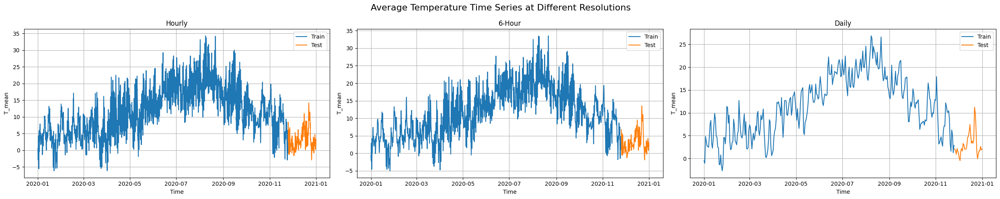

In [ ]:
# plot all time series side by side
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(25, 5))
fig.suptitle("Average Temperature Time Series at Different Resolutions", fontsize=16)

# 1H plot
axes[0].plot(hour_train.index, hour_train, label='Train')
axes[0].plot(hour_test.index, hour_test, label='Test')
axes[0].set_title("Hourly")
axes[0].set_xlabel("Time")
axes[0].set_ylabel("T_mean")
axes[0].legend()
axes[0].grid(True)

# 6H plot
axes[1].plot(six_train.index, six_train, label='Train')
axes[1].plot(six_test.index, six_test, label='Test')
axes[1].set_title("6-Hour")
axes[1].set_xlabel("Time")
axes[1].set_ylabel("T_mean")
axes[1].legend()
axes[1].grid(True)

# 24H plot
axes[2].plot(day_train.index, day_train, label='Train')
axes[2].plot(day_test.index, day_test, label='Test')
axes[2].set_title("Daily")
axes[2].set_xlabel("Time")
axes[2].set_ylabel("T_mean")
axes[2].legend()
axes[2].grid(True)

plt.tight_layout()
plt.show()

In [ ]:
# normalize again the correct temperature series
hour_train, T_mean_1H_mean, T_mean_1H_std = normalize_series(hour_train)
hour_test, _, _ = normalize_series(hour_test)

six_train, T_mean_6H_mean, T_mean_6H_std = normalize_series(six_train)
six_test, _, _ = normalize_series(six_test)
six_train_diff, T_mean_6H_mean_diff, T_mean_6H_std_diff = normalize_series(six_train_diff)
six_test_diff, _, _ = normalize_series(six_test_diff)

day_train, T_mean_24H_mean, T_mean_24H_std = normalize_series(day_train)
day_test, _, _ = normalize_series(day_test)
day_train_diff, T_mean_24H_mean_diff, T_mean_24H_std_diff = normalize_series(day_train_diff)
day_test_diff, _, _ = normalize_series(day_test_diff)

### AR (statsmodels)

In [ ]:
# helper functions

def plot_ar_residuals_and_predictions(test, preds, feature_name="T_mean", date_fmt="%Y-%m-%d %H:%M"):
  """
  Plots residuals (test - preds) and Test vs Predictions side-by-side.

  Args:
      test (pd.Series or 1D array-like): Ground truth values (ideally with DateTimeIndex)
      preds (pd.Series or 1D array-like): Model predictions aligned to `test`
      feature_name (str): Y-axis label for the Test vs Predictions plot
      date_fmt (str): Datetime tick format when index is datetime-like
  """
  # convert to Series if needed
  if not isinstance(test, pd.Series):
    test = pd.Series(test)
  if not isinstance(preds, pd.Series):
    preds = pd.Series(preds, index=test.index if test.index.size == len(preds) else None)

  # align on common index (handles slight misalignments)
  common_index = test.index.intersection(preds.index)
  test_al = test.loc[common_index].sort_index()
  preds_al = preds.loc[common_index].sort_index()

  # compute residuals
  residuals = test_al - preds_al

  # create figure with two subplots in one row
  fig, axes = plt.subplots(1, 2, figsize=(15, 5))

  # plot residuals
  ax0 = axes[0]
  ax0.plot(residuals, label="Residuals")
  ax0.axhline(0, linestyle="--", color='red', linewidth=1)
  ax0.set_title("Residuals from AR Model", fontsize=12)
  ax0.set_ylabel("Error")
  ax0.set_xlabel("Time")
  ax0.legend()

  # plot test vs predictions
  ax1 = axes[1]
  ax1.plot(test_al, label="Test Data")
  ax1.plot(preds_al, label="Predictions")
  ax1.set_title("Test Data vs Predictions", fontsize=12)
  ax1.set_ylabel(feature_name)
  ax1.set_xlabel("Time")
  ax1.legend()

  # format datetime x-axis nicely if applicable
  is_datetime = pd.api.types.is_datetime64_any_dtype(test_al.index)
  if is_datetime:
    for ax in axes:
      ax.xaxis.set_major_locator(mdates.AutoDateLocator())
      ax.xaxis.set_major_formatter(mdates.DateFormatter(date_fmt))
      for label in ax.get_xticklabels():
        label.set_rotation(45)
        label.set_ha("right")

  plt.tight_layout()
  plt.show()


def evaluate_model(y_true, y_pred):
  """
  Computes MAE, RMSE, and MAPE (%) and return them as formatted strings.

  Args:
      y_true (array-like): Ground truth values
      y_pred (array-like): Model predictions
  """
  # ensure y_true and y_pred are of the same lengths
  if len(y_true) != len(y_pred):
    raise ValueError("Input arrays must have the same length.")

  # MAE: mean absolute error
  mae = np.mean(np.abs(y_true - y_pred))

  # RMSE: root mean squared error
  rmse = np.sqrt(np.mean((y_true - y_pred)**2))

  # MAPE: mean absolute percentage error
  denom = np.clip(np.abs(y_true), 1e-8, None)  # if 0 -> use 1e-8 (avoid division by zero)
  mape = np.mean(np.abs((y_true - y_pred) / denom)) * 100

  return (f"{mae:.2f}", f"{rmse:.2f}", f"{mape:.2f}")

In [ ]:
def statsmodel_ar_simple(train, lags, freq, feat="T_mean"):
  """
  Trains a AR model from statsmodels library.

  Args:
      train (pd.Series): Training time series
      lags (list): List of lag values
      freq (str): Time frequency of the data (e.g. "1H", "6H", "24H")
      feat (str): Feature name (e.g. "T_mean")

  Returns:
      out (dict): a dictionary containing the fitted model, total training time, total trainable params, frequency and feature of the series
  """
  # create the model
  model = AutoReg(train, lags=lags, old_names=False)

  # fit the model
  start_time = time.time()
  model_fit = model.fit()
  end_time = time.time()

  # calculate and print total training time
  total_training_time = round(end_time - start_time, 4)
  # print("Total training time:", total_training_time)

  # calculate and print total trainable params
  total_trainable_params = int(model_fit.params.size)
  # print("Total trainable parameters:", total_trainable_params)

  # summary of the model
  # print("\n", model_fit.summary(), "\n")

  # store the resuults
  out = {
      "model": model_fit,
      "total_training_time": total_training_time,
      "total_trainable_params": total_trainable_params,
      "frequency": freq,
      "feature": feat
  }

  return out

In [ ]:
# train 1H statsmodels_ar to see if things go well (if yes, we continue with other resolutions)
stats_ar_1h_simple = statsmodel_ar_simple(hour_train, lag, "1H")
print("1H Time Series AR Model (1)")
print("AR(1) Model Fitting time:", stats_ar_1h_simple["total_training_time"])
print("AR(1) Model Total Prameters:", stats_ar_1h_simple["total_trainable_params"])
print("\n", stats_ar_1h_simple["model"].summary())

1H Time Series AR Model (1)
AR(1) Model Fitting time: 0.0014
AR(1) Model Total Prameters: 2

                             AutoReg Model Results                             
Dep. Variable:                 T_mean   No. Observations:                 7906
Model:                     AutoReg(1)   Log Likelihood                4231.188
Method:               Conditional MLE   S.D. of innovations              0.142
Date:                Mon, 18 Aug 2025   AIC                          -8456.376
Time:                        15:33:51   BIC                          -8435.450
Sample:                    01-01-2020   HQIC                         -8449.209
                         - 11-25-2020                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1.054e-06      0.002     -0.001      0.999      -0.003       0.003
T_mean.L1      0.9899      0.002    6

Smaller p-values (P>|z|) ⇒ more significant coefficients. For example, L1 is significant while the constant is not. Later, we include more lags (e.g. 24), so we can inspect them like this and finally select which ones to drop (e.g. p-values > 0.05).

In [ ]:
# predictions (normalized)
hour_pred_start_date = hour_test.index[0]
hour_pred_end_date = hour_test.index[-1]
stats_ar_1h_preds_simple = stats_ar_1h_simple["model"].predict(start=hour_pred_start_date, end=hour_pred_end_date)

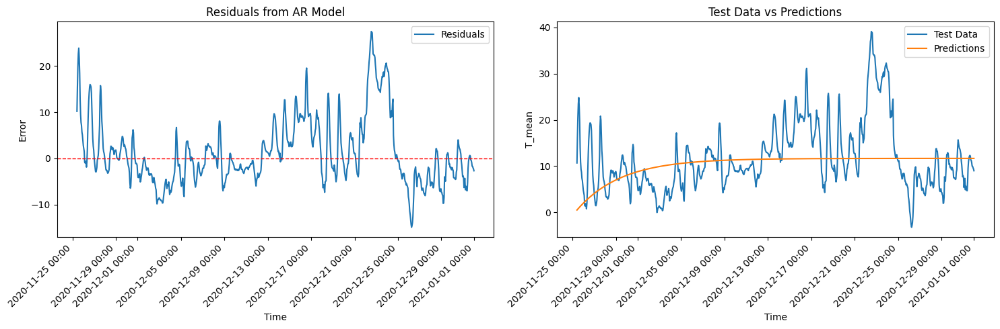

In [ ]:
# denormalize and check the results visually
stats_ar_1h_preds_simple_denorm = stats_ar_1h_preds_simple * T_mean_1H_std + T_mean_1H_mean
hour_test_denorm  = hour_test * T_mean_1H_std + T_mean_1H_mean

plot_ar_residuals_and_predictions(hour_test_denorm, stats_ar_1h_preds_simple_denorm)

The residuals plot shows large deviations, whereas ideally errors should fluctuate close to zero if predictions matched the test data. Similarly, the prediction plot confirms that $AR(1)$ fails to capture the dynamics of the series, with forecasts diverging from the true values. This suggests that $AR(1)$ alone is insufficient, and motivates trying other methods (e.g. testing larger lag sets while retaining only the most significant terms or trying rolling forecasting).

In [ ]:
# check the results numerically
stats_ar_1h_preds_simple_mae, stats_ar_1h_preds_simple_rmse, stats_ar_1h_preds_simple_mape = evaluate_model(hour_test_denorm, stats_ar_1h_preds_simple_denorm)
print("1H AR(1) Model MAE:", stats_ar_1h_preds_simple_mae)
print("1H AR(1) Model RMSE:", stats_ar_1h_preds_simple_rmse)
print("1H AR(1) Model MAPE:", stats_ar_1h_preds_simple_mape)

1H AR(1) Model MAE: 5.26
1H AR(1) Model RMSE: 7.30
1H AR(1) Model MAPE: 172.53


Next, we set max_lag=24, let IC-based selection propose candidate lags, keep only the significant ones, and test whether this tuned $AR$ outperforms the $AR(1)$ baseline.

In [ ]:
def statsmodel_ar(train, max_lag=24, ic="bic", signif=0.05, freq="1H", feat="T_mean"):
  """
  Trains an AR model with automated lag selection + significance pruning.

  Steps:
    1) Use ar_select_order() to choose lags via information criteria (AIC/BIC).
    2) Fit once, keep only lag terms with p-value < signif.
    3) Refit using the pruned lag set (fallback to original lags if none are significant).

  Args:
      train (pd.Series): Training series with DateTimeIndex
      max_lag (int): Max lag to consider in ar_select_order()
      ic (str): Information criterion ('aic' or 'bic')
      signif (float): p-value threshold for keeping lag terms
      freq (str): Series frequency label
      feat (str): Feature name

  Returns:
      dict with:
          - model: final fitted AutoRegResults
          - selected_lags: lags chosen by ar_select_order()
          - significant_lags: lags kept after p-value pruning
          - total_training_time: seconds for final refit
          - total_trainable_params: number of params in final model
          - ic, freq, feat
  """
  # step 1: initial lag selection by IC
  sel = ar_select_order(train, maxlag=max_lag, ic=ic, old_names=False)
  selected_lags = sorted(list(sel.ar_lags)) if sel.ar_lags is not None else [1]
  # print(f"Selected lags for {freq} {feat}:", selected_lags)

  # step 2: initial fit to get p-values
  init_fit = AutoReg(train, lags=selected_lags, old_names=False).fit()

  # step 3: collect significant lags (names look like 'T_mean.L24', etc.)
  significant_lags = []
  for name, pval in init_fit.pvalues.items():
    if "L" in name and pval < signif:
      lag = int(name.split("L")[-1])  # if name = 'T_mean.L24',  it keeps 24 (lag)
      significant_lags.append(lag)
  significant_lags = sorted(set(significant_lags)) or selected_lags  # fallback
  # print(f"Significant lags for {freq} {feat}:", significant_lags)

  # step 4: refit on pruned lag set
  start = time.time()
  final_fit = AutoReg(train, lags=significant_lags, old_names=False).fit()
  end = time.time()

  out = {
      "model": final_fit,
      "selected_lags": selected_lags,
      "significant_lags": significant_lags,
      "total_training_time": round(end - start, 4),
      "total_trainable_params": int(final_fit.params.size),
      "ic": ic,
      "frequency": freq,
      "feature": feat,
  }
  return out

In [ ]:
# train 1H/6H/24H statsmodels_ar
stats_ar_1h = statsmodel_ar(hour_train, freq="1H")
print("1H Time Series AR Model (1)")
print("AR Model Fitting Time:", stats_ar_1h["total_training_time"])
print("AR Model Total Prameters:", stats_ar_1h["total_trainable_params"])
print("AR Lags:", stats_ar_1h["significant_lags"])
print("\n", stats_ar_1h["model"].summary())

1H Time Series AR Model (1)
AR Model Fitting Time: 0.0065
AR Model Total Prameters: 11
AR Lags: [1, 2, 3, 4, 7, 14, 15, 22, 23, 24]

                             AutoReg Model Results                             
Dep. Variable:                 T_mean   No. Observations:                 7906
Model:             Restr. AutoReg(24)   Log Likelihood                8056.176
Method:               Conditional MLE   S.D. of innovations              0.087
Date:                Mon, 18 Aug 2025   AIC                         -16088.351
Time:                        15:33:51   BIC                         -16004.683
Sample:                    01-02-2020   HQIC                        -16059.692
                         - 11-25-2020                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       8.849e-05      0.001      0.090      0.928      -0.002       0.0

Some lags now have high p-values because they were significant in the initial IC-based selection, but became non-significant after refitting on the pruned set.

In [ ]:
# AR(11) predictions (normalized)
stats_ar_1h_preds = stats_ar_1h["model"].predict(start=hour_pred_start_date, end=hour_pred_end_date)

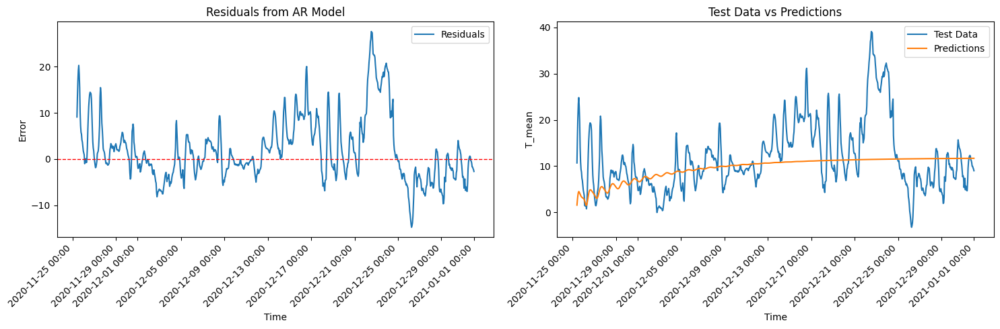

In [ ]:
# denormalize and check results visually
stats_ar_1h_preds_denorm = stats_ar_1h_preds * T_mean_1H_std + T_mean_1H_mean
plot_ar_residuals_and_predictions(hour_test_denorm, stats_ar_1h_preds_denorm)

In [ ]:
# check the results numerically
stats_ar_1h_preds_mae, stats_ar_1h_preds_rmse, stats_ar_1h_preds_mape = evaluate_model(hour_test, stats_ar_1h_preds)

# get AR order p from the fitted model
p = stats_ar_1h["total_trainable_params"]

print(f"1H AR({p}) Model MAE: {stats_ar_1h_preds_mae}")
print(f"1H AR({p}) Model RMSE: {stats_ar_1h_preds_rmse}")
print(f"1H AR({p}) Model MAPE: {stats_ar_1h_preds_mape}")

1H AR(11) Model MAE: 0.70
1H AR(11) Model RMSE: 0.98
1H AR(11) Model MAPE: 181.68


Numerically, $AR(11)$ beats $AR(1)$ (lower MAE/RMSE/MAPE), but visually it still collapses toward a flat level and misses the swings after the first few predictions as the performance degrades.

**Rolling Forecast Origin**

In a fit-once (static) evaluation we train on the training set/period once and forecast the whole test set with fixed parameters, using the same observed test history at each step (teacher forcing).

In contrast, Rolling Forecast Origin is a more realistic, walk-forward evaluation. At each test timestamp $t$:

*   Fit / update on all data up to $t-1$ (expanding window).
*   Forecast $h$ steps ahead from that origin (recursive if $h-1$ and record the last predicted step $y_{t+h}$.
*   Reveal the true observation $y_{t}$ and append it to the history.
*   Move the origin to $t + 1$ and repeat.

We then align all predicted $y_{t+h}$ with their truths and compute MAE. We'll run this procedure for both $AR(1)$ and $AR(11)$ to compare them under a more realistic evaluation.

**Alternative:**
A dynamic variant **appends the prediction** instead of the observed value across origins (self-feeding). It simulates a “no new data” scenario but usually inflates errors and is not representative when observations are available.

In [ ]:
# tiny example that shows step-by-step how multi-step forecasts are generated using predicted diffs, updating the base each time

# grouund-truth past
y_hist = [10, 12, 15] # last observed level y_t = 15
last = y_hist[-1]
print("True past levels:", y_hist, "| Last observed:", last)

# ground-truth future
true_levels = [18, 20] # suppose these are the next two real values
true_diffs  = [3, 2] # so true changes are +3 then +2
print("True future levels:", true_levels)
print("True future diffs:", true_diffs)

# for horizon=1
print("\n--- Horizon = 1 ---")
pred_diffs = [2.0] # model predicts "next change = +2"
preds_levels = []

base = last
for step, d_hat in enumerate(pred_diffs, start=1):
  y_pred = base + d_hat
  preds_levels.append(y_pred)
  print(f"Step {step}: Base={base}, Pred Δ={d_hat}, Pred Level={y_pred} || True Δ={true_diffs[step-1]}, True Level={true_levels[step-1]}")
  base = y_pred  # update base with prediction

print("Predicted diffs:", pred_diffs)
print("Predicted levels:", preds_levels)

# for horizon=2
print("\n--- Horizon = 2 ---")
pred_diffs = [2.0, 4.0] # step1: +2 (->17), step2: +4 (->21)
preds_levels = []

base = last
for step, d_hat in enumerate(pred_diffs, start=1):
  y_pred = base + d_hat
  preds_levels.append(y_pred)
  print(f"Step {step}: Base={base}, Pred Δ={d_hat}, Pred Level={y_pred} || True Δ={true_diffs[step-1]}, True Level={true_levels[step-1]}")
  base = y_pred

print("Predicted diffs:", pred_diffs)
print("Predicted levels:", preds_levels)

# cumulative sum method (direct formula)
cumsum_levels = last + np.cumsum(pred_diffs)
print("Predicted levels (via cumsum):", cumsum_levels.tolist())

# residuals (true - predicted) at each horizon step
true_arr = np.array(true_levels)
pred_arr = np.array(preds_levels)
print("\nShapes -> True:", true_arr.shape, "| Pred:", pred_arr.shape)

residuals = true_arr - pred_arr
print("Residuals (true - predicted):", residuals.tolist())

True past levels: [10, 12, 15] | Last observed: 15
True future levels: [18, 20]
True future diffs: [3, 2]

--- Horizon = 1 ---
Step 1: Base=15, Pred Δ=2.0, Pred Level=17.0 || True Δ=3, True Level=18
Predicted diffs: [2.0]
Predicted levels: [17.0]

--- Horizon = 2 ---
Step 1: Base=15, Pred Δ=2.0, Pred Level=17.0 || True Δ=3, True Level=18
Step 2: Base=17.0, Pred Δ=4.0, Pred Level=21.0 || True Δ=2, True Level=20
Predicted diffs: [2.0, 4.0]
Predicted levels: [17.0, 21.0]
Predicted levels (via cumsum): [17.0, 21.0]

Shapes -> True: (2,) | Pred: (2,)
Residuals (true - predicted): [1.0, -1.0]


In [ ]:
# normally we get diffs of different lengths and the model predicts up to horizon=h, so to be abble to compare an alignment is needed
pred_diffs_arr = np.array(pred_diffs) # shape (h,)
true_diffs_arr = np.array(true_diffs) # shape (h,)
h = len(pred_arr) # here h=2

print("--- Diff-space comparison ---")
print("Shapes -> True diffs:", true_diffs_arr.shape, "| Pred diffs:", pred_diffs_arr.shape) # shape (h,)

diff_residuals = true_diffs_arr - pred_diffs_arr
print("Diff residuals (true_diffs - pred_diffs):", diff_residuals.tolist())

# longer future diffs available (h_true=4) -> slice the first h to align
true_diffs_long = np.array([3, 2, 1, 0]) # pretend more ground-truth future
print("\nShapes -> True diffs (long):", true_diffs_long.shape)
aligned_true_diffs = true_diffs_long[:h] # keep only the first h steps
print("Aligned (slice) True diffs:", aligned_true_diffs.tolist(), "(to match horizon)")

# misaligned diffs that include a one extra at the front
misaligned_true_diffs = np.array([999, 3, 2]) # 999 = a diff from BEFORE t+1
print("\nShapes -> True diffs (misaligned):", misaligned_true_diffs.shape)
aligned_drop = misaligned_true_diffs[(h-1):] # drop first h-1 = 1 element -> [3, 2]
print("Aligned (drop first h-1) True diffs:", aligned_drop.tolist(), "(removed pre-step diff)")

--- Diff-space comparison ---
Shapes -> True diffs: (2,) | Pred diffs: (2,)
Diff residuals (true_diffs - pred_diffs): [1.0, -2.0]

Shapes -> True diffs (long): (4,)
Aligned (slice) True diffs: [3, 2] (to match horizon)

Shapes -> True diffs (misaligned): (3,)
Aligned (drop first h-1) True diffs: [3, 2] (removed pre-step diff)


In [ ]:
def rolling_forecast_origin_simple(train, test, horizon=1, mode="ar1", freq="1H", feat="T_mean", max_lag=24, ic="bic", signif=0.05, plot=True, level_train=None, level_test=None):
  """
  Walk-forward (expanding window) h-step-ahead (last-step) evaluation using AR models.

  Args:
      train (pd.Series): Training series (preferably with a DateTimeIndex)
      test (pd.Series): Test/holdout series aligned in time (DateTimeIndex)
      horizon (int): Forecast horizon h (e.g. 6 for 6-step-ahead from the first origin)
      mode (str): "ar1" for statsmodel_ar_simple(lags=[1]) and "auto" for statsmodel_ar(max_lag, ic, signif)
      freq (str): Frequency tag passed to helper functions (e.g. "1H")
      feat (str): Feature name tag (e.g. "T_mean")
      max_lag (int): Max lag to consider when mode="auto"
      ic (str): Information criterion ("aic" or "bic") for selection when mode="auto"
      signif (float): p-value threshold for pruning when mode="auto"
      plot (bool): If True, plot residuals and test vs. predictions
      level_train (pd.Series|None): If provided, indicates train/test are in DIFF space. Used as the LEVEL series to invert predictions (no leakage)
      level_test (pd.Series|None): Matching LEVEL series for `test` (same index as `test`)

  Returns:
      preds (pd.Series): One or N step-ahead forecasts aligned to `test` index
      metrics (tuple[str, str, str]): (MAE, RMSE, MAPE%) as formatted strings from `evaluate_model`
      total_time (float): Total training time
  """
  history = train.copy()
  preds = []

  # if level series are provided, we keep a LEVEL history for correct inversion (diff -> level)
  use_inversion = (level_train is not None) and (level_test is not None)
  if use_inversion:
    history_level = level_train.copy()

  start_time = time.time()
  for i, (t, y_t) in enumerate(test.items()):
    # fit on all data up to t-1 (expanding window)
    if mode == "ar1":
      res = statsmodel_ar_simple(history, lags=[1], freq=freq, feat=feat)
    elif mode == "auto":
      res = statsmodel_ar(history, max_lag=max_lag, ic=ic, signif=signif, freq=freq, feat=feat)
    else:
      raise ValueError("mode must be 'ar1' or 'auto'")

    model = res["model"]

    # predict the next horizon points for the current time t
    n = len(model.model.endog) # length of the training sample used in the fit

    predictions = model.predict(start=n, end=n + horizon - 1) # this targets at index test[t + (h-1)], we are NOT forecasting the first (h-1) test timestamps (they remain NaN by design)
    # yhat = float(predictions.iloc[0])

    # for LEVEL models: ŷ_{t+h} = last(predicted_level_path)
    # for DIFF models: ŷ_{t+h} = y_t + sum(Δŷ_{t+1..t+h}) (start at last observed level y_t, add all predicted diffs)
    if use_inversion:
      base_level = float(history_level.iloc[-1]) # y_t (LEVEL at origin)
      yhat_h = base_level + float(np.cumsum(predictions).iloc[-1])  # sum of predicted diffs
    else:
      yhat_h = float(predictions.iloc[-1])  # level directly

    preds.append(yhat_h)
    history.loc[t] = y_t # walk forward (append the true y to history -> rolling)

    if use_inversion:
      history_level.loc[t] = level_test.loc[t]  # update LEVEL history with the true level

  end_time = time.time()
  total_time = round(end_time - start_time, 4)
  # print("Total time:", total_time)

  # shift by (h-1) to align timestamps
  preds = pd.Series(preds, index=test.index, name=f"{freq} {feat}_pred").shift(horizon-1)

  # choose the correct target for metrics/plots
  target = level_test if use_inversion else test

  # align indices before masking (prevents 'Unalignable boolean Series')
  target = target.reindex(preds.index)

  # filter to timestamps with valid, non-NaN entries
  mask = preds.notna()
  preds = preds[mask]
  target = target[mask]
  mae, rmse, mape = evaluate_model(target, preds)

  if plot:
    plot_ar_residuals_and_predictions(target, preds, feature_name=feat)

  return preds, (mae, rmse, mape), total_time

**Important Note:** In rolling forecast origin, when we have to use differenced data, we normalize the DIFF series, predict normalized diffs, and may think to "just add them" to normalized levels. BUT: **normalized(y) + normalized(diff)  !=  normalized(y+diff).**

What we really need for correct rolling updates is:
  * Denormalize the predicted diffs back to raw scale,
  * Add them to the last raw level y_t,
  * Then renormalize the result.

Below is a proof with a tiny example list.

In [ ]:
# (normalize+add) is not equal to (add+normalize)

# original series
y = np.array([10, 12, 15], dtype=float)
print("Raw series:", y)

# differences
diffs = np.diff(y) # [2, 3]
print("Raw diffs:", diffs)

# training stats
mu_d, sd_d = diffs.mean(), diffs.std(ddof=0) # for diffs
mu_y, sd_y = y.mean(), y.std(ddof=0) # for levels

# last observed LEVEL and next DIFF
y_t = y[1] # 12
diff_next = diffs[1] # 3

# normalize separately
y_t_n = (y_t - mu_y) / sd_y
diff_next_n = (diff_next - mu_d) / sd_d
print("Normalized series + normalized diffs:", y_t_n + diff_next_n)

# normalize the sum directly
sum_raw = y_t + diff_next # 15
sum_n = (sum_raw - mu_y) / sd_y
print("Normalized (series + diffs):", sum_n)

# denormalize separately then add
y_t_denorm = mu_y + sd_y * y_t_n
diff_next_denorm = mu_d + sd_d * diff_next_n
print("Denormalized series + denormalized diffs:", y_t_denorm + diff_next_denorm)

# denormalize the sum directly
sum_denorm = mu_y + sd_y * sum_n
print("Denormalized (series + diffs):", sum_denorm)

Raw series: [10. 12. 15.]
Raw diffs: [2. 3.]
Normalized series + normalized diffs: 0.8377785788692371
Normalized (series + diffs): 1.2977713690461
Denormalized series + denormalized diffs: 15.0
Denormalized (series + diffs): 15.0


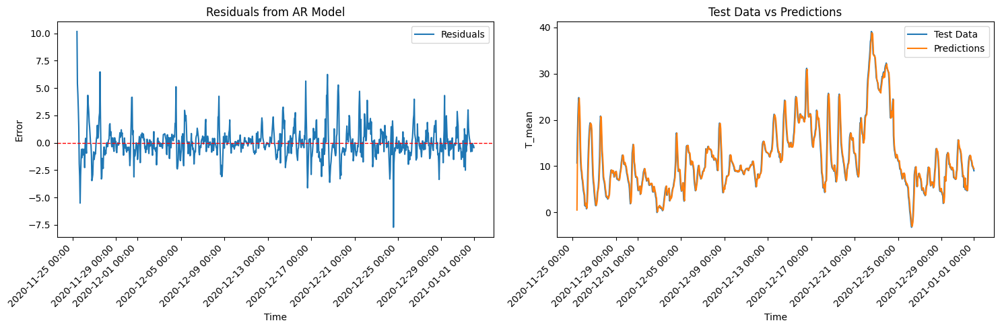

1H AR(1) Training Time: 3.5335
1H AR(1): MAE=0.94, RMSE=1.40, MAPE=23.09


In [ ]:
# 1H AR(1) baseline (lags=[1])
preds_ar1, (_, _, _), time_ar1 = rolling_forecast_origin_simple(hour_train, hour_test, mode="ar1", plot=False)

# denormalize and evaluate
preds_ar1_denorm = preds_ar1 * T_mean_1H_std + T_mean_1H_mean
mae1, rmse1, mape1 = evaluate_model(hour_test_denorm, preds_ar1_denorm)

# plot in original levels
plot_ar_residuals_and_predictions(hour_test_denorm, preds_ar1_denorm)

print("1H AR(1) Training Time:", time_ar1)
print(f"1H AR(1): MAE={mae1}, RMSE={rmse1}, MAPE={mape1}")

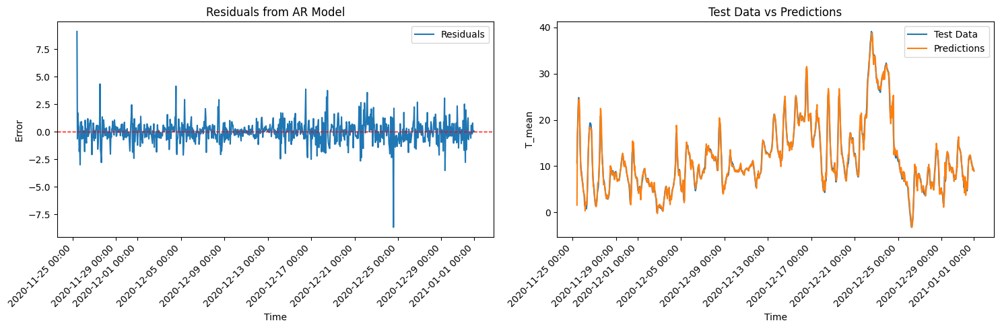

1H AR(auto) Training Time: 134.9339
1H AR(auto, max_lag=24): MAE=0.68, RMSE=1.01, MAPE=11.20


In [ ]:
# 1H auto-selected AR (max_lag=24, BIC, prune @ 0.05)
preds_auto, (_, _, _), time_auto = rolling_forecast_origin_simple(hour_train, hour_test, mode="auto", plot=False)

# denormalize and evaluate
preds_auto_denorm = preds_auto * T_mean_1H_std + T_mean_1H_mean
maeA, rmseA, mapeA = evaluate_model(hour_test_denorm, preds_auto_denorm)

# plot in original scale
plot_ar_residuals_and_predictions(hour_test_denorm, preds_auto_denorm)

print("1H AR(auto) Training Time:", time_auto)
print(f"1H AR(auto, max_lag=24): MAE={maeA}, RMSE={rmseA}, MAPE={mapeA}")
# in walk-forward with auto lag selection, the lag set is re-estimated at every step. As the training window expands, AIC/BIC and p-values change, so the selected lags—and thus the AR order p can differ across refits

Numerically, the auto-$AR$ (max_lag=24) clearly outperforms $AR(1)$, but it's much slower to train, and visually both prediction lines align the test series so closely that the improvement isn't obvious. Given the small visual gain versus the big training-time cost, we'll keep $AR(1)$ as our baseline choice (as our first selection was based on PACF plots) for simplicity, stability, and speed.

In [ ]:
# preview some test samples with their actual and predicted values (notice redictions are getting better from 0 to 5)
print("Test samples' actual values:\n", hour_test_denorm.iloc[:5])
print("\nTest samples' predicted values:\n", preds_ar1_denorm.iloc[:5])

Test samples' actual values:
 datetime
2020-11-25 10:00:00    10.685550
2020-11-25 11:00:00    16.096406
2020-11-25 12:00:00    20.472105
2020-11-25 13:00:00    23.470347
2020-11-25 14:00:00    24.802440
Freq: h, Name: T_mean, dtype: float64

Test samples' predicted values:
 datetime
2020-11-25 10:00:00     0.517032
2020-11-25 11:00:00    10.697100
2020-11-25 12:00:00    16.052545
2020-11-25 13:00:00    20.383836
2020-11-25 14:00:00    23.352272
Freq: h, Name: 1H T_mean_pred, dtype: float64


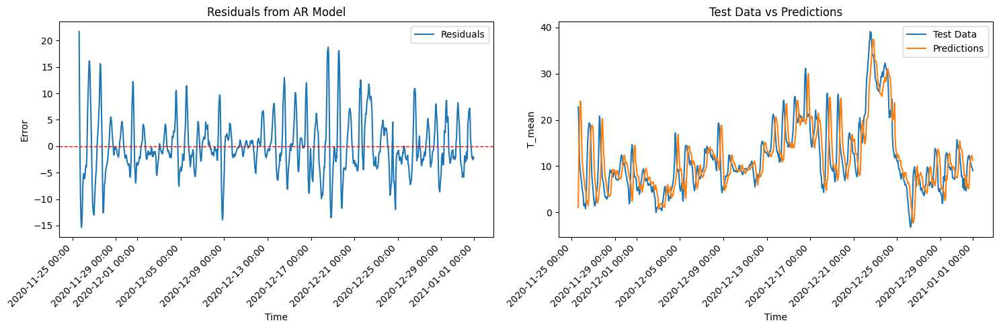

6 steps-ahead forecasts (1H series)
1H AR(1) Training Time: 3.5607
1H AR(1): MAE=3.85, RMSE=5.21, MAPE=101.83


In [ ]:
# 1H n-steps ahead preds using AR(1)
hor=6 # next 6 hours (or 1 6-hour slot)
preds_ar1_n, (_, _, _), time_ar1_n = rolling_forecast_origin_simple(hour_train, hour_test, horizon=hor, mode="ar1", plot=False)

# denormalize, plot evaluate in original level
preds_ar1_n_denorm = preds_ar1_n * T_mean_1H_std + T_mean_1H_mean
hour_test_denorm = hour_test_denorm.loc[preds_ar1_n_denorm.index] # align hour_test_denorm to preds index
mae1n, rmse1n, mape1n = evaluate_model(hour_test_denorm, preds_ar1_n_denorm)
plot_ar_residuals_and_predictions(hour_test_denorm, preds_ar1_n_denorm)

print(f"{hor} steps-ahead forecasts (1H series)")
print("1H AR(1) Training Time:", time_ar1_n)
print(f"1H AR(1): MAE={mae1n}, RMSE={rmse1n}, MAPE={mape1n}")

When we try to predict 6 steps ahead with a model that was trained to predict just the next hour, errors arise. Each new step uses the previous prediction as input, so small mistakes grow, the curve gets too smooth, and fast changes are missed.

So, a 1-hour model is not good for 6 hours ahead. Next, we'll switch to a 6-hour time grid and train an $AR(1)$ on the 6H series, and make one-step-ahead predictions in that new timeline (which means “the next 6-hour slot”). This changes the data frequency, so we re-train the model (same AR idea, but the value of lag differ). Then we'll compare which approach works better.

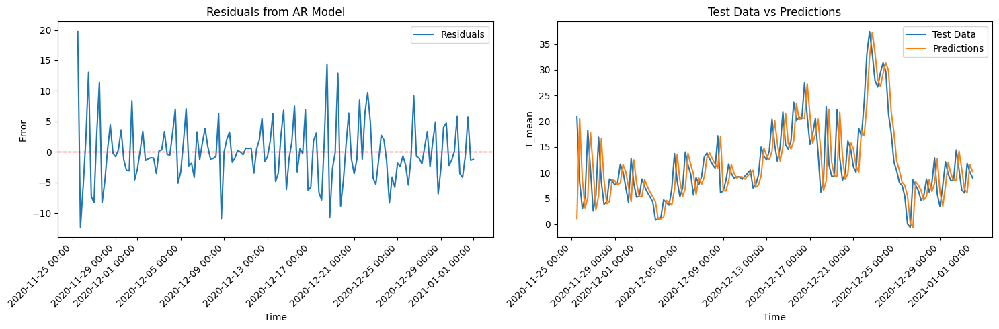

6H AR(1) Training Time: 0.4919
6H AR(1): MAE=3.68, RMSE=5.00, MAPE=109.62


In [ ]:
# 6H AR(1) baseline on diffs
preds_ar6, (_, _, _), time_ar6 = rolling_forecast_origin_simple(
    six_train_diff, six_test_diff, mode="ar1", freq="6H", plot=False,
    # include original levels (for inside inversion)
    level_train=six_train, level_test=six_test
    )

# invertion is done inside the function in this case, so we proceed

# denormalize, plot and evaluate on the original levels
six_test_denorm = six_test * T_mean_6H_std + T_mean_6H_mean
preds_ar6_denorm = preds_ar6 * T_mean_6H_std + T_mean_6H_mean
plot_ar_residuals_and_predictions(six_test_denorm, preds_ar6_denorm)
mae6, rmse6, mape6 = evaluate_model(six_test_denorm, preds_ar6_denorm)

# training time and metrics
print("6H AR(1) Training Time:", time_ar6)
print(f"6H AR(1): MAE={mae6}, RMSE={rmse6}, MAPE={mape6}")

Forecasting a 6-hour horizon with the 1H $AR$ model yields worse accuracy and longer training time than using the 6H series with a 1-step horizon (the next 6 hours).

In [ ]:
# preview some test samples with their actual and predicted values
print("Test samples' actual values:\n", six_test_denorm.iloc[:5])
print("Test samples' predicted values:\n", preds_ar6_denorm.iloc[:5])

Test samples' actual values:
 datetime
2020-11-25 12:00:00    20.855331
2020-11-25 18:00:00     8.187482
2020-11-26 00:00:00     2.961256
2020-11-26 06:00:00     5.195871
2020-11-26 12:00:00    18.206187
Freq: 6h, Name: T_mean, dtype: float64
Test samples' predicted values:
 datetime
2020-11-25 12:00:00     1.120356
2020-11-25 18:00:00    20.527265
2020-11-26 00:00:00     8.605344
2020-11-26 06:00:00     3.113279
2020-11-26 12:00:00     5.129620
Freq: 6h, Name: 6H T_mean_pred, dtype: float64


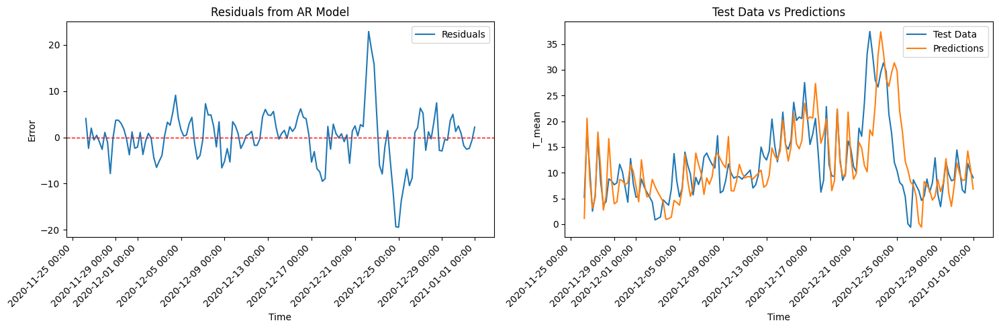

6 steps-ahead forecasts (6H series)
6H AR(1) Training Time: 0.5027
6H AR(1): MAE=3.88, RMSE=5.58, MAPE=192.84


In [ ]:
# 6H n-steps ahead preds using AR(1) on diffs
hor6=4 # 24h ahead on the 6H grid
preds_ar6_n, (_, _, _), time_ar6_n = rolling_forecast_origin_simple(six_train_diff, six_test_diff, horizon=hor6, mode="ar1", freq="6H",
 # pass the matching LEVEL series to enable inversion (diff -> level)
 level_train=six_train, level_test=six_test, plot=False)

# denormalize, plot and evaluate on original levels
preds_ar6_n_denorm = preds_ar6_n * T_mean_6H_std + T_mean_6H_mean
six_test_denorm = six_test_denorm.loc[preds_ar6_n_denorm.index] # align six_test_denorm to preds index
plot_ar_residuals_and_predictions(six_test_denorm, preds_ar6_n_denorm)
mae6n, rmse6n, mape6n = evaluate_model(six_test_denorm, preds_ar6_n_denorm)

print(f"{hor} steps-ahead forecasts (6H series)")
print("6H AR(1) Training Time:", time_ar6_n)
print(f"6H AR(1): MAE={mae6n}, RMSE={rmse6n}, MAPE={mape6n}")

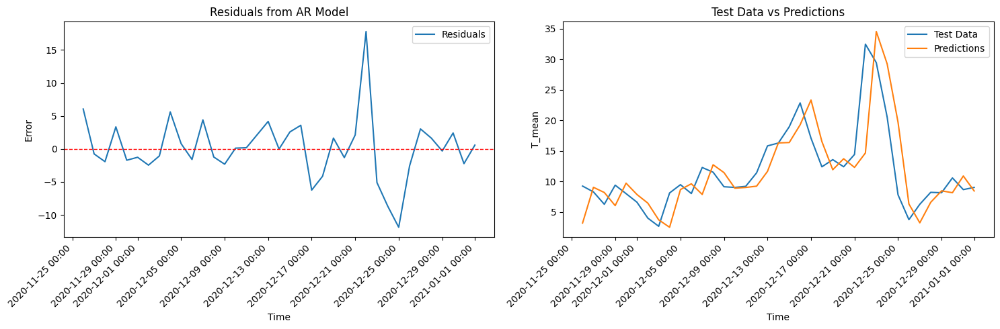

24H AR(1) Training Time: 0.1209
24H AR(1): MAE=3.22, RMSE=4.71, MAPE=29.65


In [ ]:
# 24H AR(1) baseline on diffs
preds_ar24, (_, _, _), time_ar24 = rolling_forecast_origin_simple(
    day_train_diff, day_test_diff, mode="ar1", freq="24H", plot=False,
    # include original level sets for inside inversion
    level_train=day_train, level_test=day_test
    )

# invertion is done inside the function in this case, so we proceed

# denormalize, plot and evaluate on the original levels
day_test_denorm = day_test * T_mean_24H_std + T_mean_24H_mean
preds_ar24_denorm = preds_ar24 * T_mean_24H_std + T_mean_24H_mean
plot_ar_residuals_and_predictions(day_test_denorm, preds_ar24_denorm)
mae24, rmse24, mape24 = evaluate_model(day_test_denorm, preds_ar24_denorm)

# training time and metrics
print("24H AR(1) Training Time:", time_ar24)
print(f"24H AR(1): MAE={mae24}, RMSE={rmse24}, MAPE={mape24}")

Using the 6H model to predict 4 steps ahead (next day) is worse than using a 24H model to predict 1 step (next day) because the 6H route chains four recursive forecasts, so errors accumulate and we work on a noisier, higher-frequency scale, while the 24H model makes the daily move in one shot on the natural 24-hour timescale, which captures daily structure better and avoids compounding error.

In [ ]:
# preview some test samples with their actual and predicted values
print("Test samples' actual values:\n", day_test_denorm.iloc[:5])
print("\nTest samples' predicted values:\n", preds_ar24_denorm.iloc[:5])

Test samples' actual values:
 datetime
2020-11-26    9.253810
2020-11-27    8.299947
2020-11-28    6.276077
2020-11-29    9.402432
2020-11-30    8.018766
Freq: D, Name: T_mean, dtype: float64

Test samples' predicted values:
 datetime
2020-11-26    3.205262
2020-11-27    9.051309
2020-11-28    8.200838
2020-11-29    6.057998
2020-11-30    9.727970
Freq: D, Name: 24H T_mean_pred, dtype: float64


In [ ]:
# store all the results
columns = ["Model", "Resolution", "Horizon", "Target Variable", "Input Type", "MAE", "RMSE", "MAPE (%)", "Fit Time", "# Params"]

ar_results = [
    ("AR(1)", "1-hour", "t+1", "T_mean", "Univariate", mae1, rmse1, mape1, time_ar1, 2),
    ("AR(1)", "1-hour", "t+6", "T_mean", "Univariate", mae1n, rmse1n, mape1n, time_ar1_n, 2),
    ("AR(1)", "6-hour", "t+1", "T_mean", "Univariate", mae6, rmse6, mape6, time_ar6, 2),
    ("AR(1)", "6-hour", "t+4", "T_mean", "Univariate", mae6n, rmse6n, mape6n, time_ar6_n, 2),
    ("AR(1)", "24-hour", "t+1", "T_mean", "Univariate", mae24, rmse24, mape24, time_ar24, 2)
]

In [ ]:
# print ar__results
print(tabulate(ar_results, headers=columns, tablefmt="github", floatfmt=".2f"))

| Model   | Resolution   | Horizon   | Target Variable   | Input Type   |   MAE |   RMSE |   MAPE (%) |   Fit Time |   # Params |
|---------|--------------|-----------|-------------------|--------------|-------|--------|------------|------------|------------|
| AR(1)   | 1-hour       | t+1       | T_mean            | Univariate   |  0.94 |   1.40 |      23.09 |       3.53 |          2 |
| AR(1)   | 1-hour       | t+6       | T_mean            | Univariate   |  3.85 |   5.21 |     101.83 |       3.56 |          2 |
| AR(1)   | 6-hour       | t+1       | T_mean            | Univariate   |  3.68 |   5.00 |     109.62 |       0.49 |          2 |
| AR(1)   | 6-hour       | t+4       | T_mean            | Univariate   |  3.88 |   5.58 |     192.84 |       0.50 |          2 |
| AR(1)   | 24-hour      | t+1       | T_mean            | Univariate   |  3.22 |   4.71 |      29.65 |       0.12 |          2 |


**Summary**

We began by checking stationarity because classical $AR$ models assume it (unlike most neural nets). Using PACF (mainly) and AIC/BIC, we pointed out a few candidate lag sets, but early visual tests suggested that a simple $AR(1)$ tracked the signal about as well as multi-lag options, while keeping the model simple. Our first implementation with predictions with statsmodels looked poor, so we switched to a more realistic rolling (walk-forward) evaluation. Under that setup we compared $AR(1)$ with an automatically selected multi-lag $AR$ (via IC + significance pruning). The auto models scored a bit better on MAE/RMSE/MAPE, but the gains were modest, training time was much more, and the prediction curves were not visibly superior. We therefore kept $AR(1)$ as a robust baseline and reported results for both 1-step and n-step forecasts across the 1H, 6H, and 24H resolutions (handling differenced vs. original level series correctly).

### AR (custom)

In [ ]:
# custom AR

def custom_ar(X):
  """
  Fits AR model y_t = w*y_{t-1} + b using normal equation (LS).

  Args:
      X (pd.Series): Series with DateTimeIndex
  Returns:
      w (float): AR coefficient
      b (float): AR intercept
      n_params (int): Number of total parameters
  """
  s = X.dropna()  # y = [y0, y1, y2, ...] of shape (N,)
  # print(s.shape)
  # print(s[:3])

  y = s.iloc[1:].values # target y_t = [y1, y2, ...] of shape (N-1,)
  x = s.shift(1).iloc[1:].values.reshape(-1, 1) # y_{t-1} = [y0, y1, y2, ...] of shape (N-1,1)
  # print(x.shape, y.shape)
  # print(x[:3], y[:3])

  X = np.hstack((x, np.ones_like(x))) # [y_{t-1}, 2]  # add bias term
  # print(X.shape)
  # print(X[:3])

  start_time = time.time()
  theta = np.linalg.pinv(X.T @ X) @ (X.T @ y) # normal equation
  w, b = float(theta[0]), float(theta[1])
  end_time = time.time()

  total_time = round(end_time - start_time, 4)
  # print("Total fit time:", total_time)

  n_params = theta.size
  # print("Total number of parameters:", n_params)

  return w, b, total_time, n_params


def predict_custom_ar(X, y, w, b):
  """
  Predicts the target values using AR model y_t ≈ w*y_{t-1} + b in a teacher-forcing setup, e.g. each prediction uses the true previous observation from the test set instead of the model’s own past predictions.

  Args:
      X (pd.Series): Series with DateTimeIndex
      y (pd.Series): Series with DateTimeIndex
      w (float): AR coefficient
      b (float): AR intercept

  Returns:
      preds (pd.Series): Series with DateTimeIndex
  """
  # recreate target set using as first element the last sample from train set (for first pred)
  prev = y.shift(1).copy()
  prev.iloc[0] = X.iloc[-1]

  preds = w * prev + b
  # preds.name = "AR_custom_pred"
  # print(preds.head())
  return preds


def predict_recursive(train_series, horizon_index, w, b):
  """
  Predicts the target values using AR model y_t = w*y_{t-1} + b in a recursive (rolling) forecasting setup, e.g. the model’s own predictions are fed back as inputs for subsequent steps, using the same weights and without using ground-truth test values.

  Args:
      train_series (pd.Series): Series with DateTimeIndex
      horizon_index (pd.DatetimeIndex): Index of future timesteps to generate predictions for
      w (float): AR coefficient
      b (float): AR intercept

  Returns:
      preds (pd.Series): Series with DateTimeIndex
  """
  prev = train_series.iloc[-1]
  preds = []
  for _ in range(len(horizon_index)):
    yhat = w * prev + b
    preds.append(yhat)
    prev = yhat
  return pd.Series(preds, index=horizon_index)


def predict_recursive_refit(train_series, test_series, horizon=1, level_train=None, level_test=None, plot=False, feature_name="T_mean"):
  """
  Rolling-forecast-origin (expanding window) using a custom AR(1): y_t = w*y_{t-1} + b.

  At each origin (each test timestamp):
    1) Refit AR(1) on all data seen so far (expanding window) using `custom_ar`
    2) Generate an h-step-ahead forecast path recursively (feed predictions forward)
    3) Take the h-th value as the forecast for that origin
    4) Reveal the true observation and append it to history (walk forward)

  If `level_train`/`level_test` are provided, we assume `train_series`/`test_series` are in DIFF space and we invert forecasts back to LEVEL by:
      ŷ_{t+h} = last_level + sum(Δŷ_{t+1..t+h})

  Args:
      train_series (pd.Series): Training series (LEVEL if no inversion; DIFF if using inversion)
      test_series (pd.Series): Test/holdout series aligned in time (same space as train_series)
      horizon (int): Forecast horizon h (>=1)
      level_train (pd.Series|None): LEVEL series matching `train_series` index (only when data are DIFF)
      level_test (pd.Series|None): LEVEL series matching `test_series` index (only when data are DIFF)
      plot (bool): If True, plot residuals and predictions
      feature_name (str): Label for plots

  Returns:
      preds (pd.Series): Forecasts aligned to `test_series.index`, shifted by (h-1)
      metrics (tuple[str,str,str]): (MAE, RMSE, MAPE%) from `evaluate_model`
      total_time (float): Total refit+forecast runtime (seconds)
  """
  use_inversion = (level_train is not None) and (level_test is not None)

  history = train_series.copy()
  if use_inversion:
    history_level = level_train.copy()

  preds = []
  start_time = time.time()

  for t, y_t in test_series.items():
    # step 1: refit on expanding window
    w, b, _, _ = custom_ar(history)

    # step 2: make an h-step recursive path on the *current space*
    prev = history.iloc[-1]
    path = []
    for _ in range(horizon):
      yhat = w * prev + b
      path.append(float(yhat))
      prev = yhat

    # step 3: take the h-th step and invert if needed
    if use_inversion:
      base_level = float(history_level.iloc[-1]) # y_t (LEVEL at origin)
      yhat_h = base_level + float(np.cumsum(path)[-1]) # sum predicted diffs
    else:
      yhat_h = path[-1] # LEVEL directly

    preds.append(yhat_h)

    # step 4: walk forward with truth
    history.loc[t] = y_t
    if use_inversion:
      history_level.loc[t] = level_test.loc[t]

  total_time = round(time.time() - start_time, 4)

  # align and evaluate
  preds = pd.Series(preds, index=test_series.index, name=f"pred_{feature_name}").shift(horizon - 1)

  target = level_test if use_inversion else test_series
  target = target.reindex(preds.index)  # ensure alignment

  mask = preds.notna()
  preds = preds[mask]
  target = target[mask]

  mae, rmse, mape = evaluate_model(target, preds)

  if plot:
    plot_ar_residuals_and_predictions(target, preds, feature_name=feature_name)

  return preds, (mae, rmse, mape), total_time

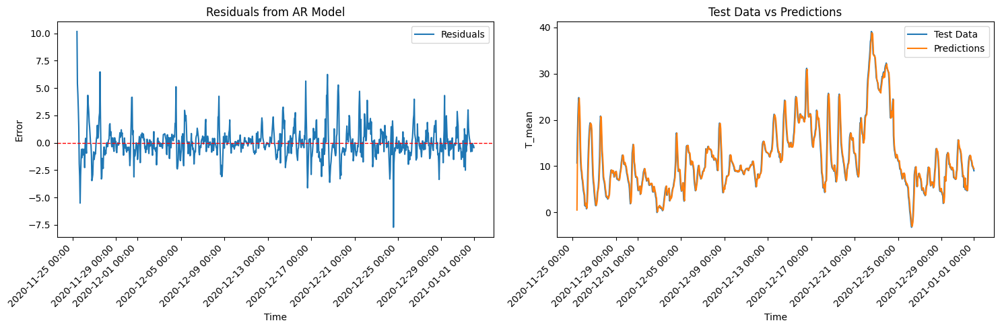

1H Custom AR(1) Training Time: 0.6966
1H Custom AR(1): MAE: 0.94 RMSE: 1.40 MAPE: 23.09


In [ ]:
# 1H custom AR

# compute custom AR weights
# customAR = custom_ar(hour_train)

# make predictions
# preds_custom = predict_custom_ar(hour_train, hour_test, customAR[0], customAR[1]) # teacher force method (use ground truth as y(t-1))
# preds_custom = predict_recursive(hour_train, hour_test.index, customAR[0], customAR[1]) # rolling forecasting (use predicted y(t) as next y(t-1))
preds_custom1, (_, _, _), tt1 = predict_recursive_refit(hour_train, hour_test)

# denormalize both preds and hour_test
hour_test_denorm = hour_test * T_mean_1H_std + T_mean_1H_mean
preds_custom_denorm1 = preds_custom1 * T_mean_1H_std + T_mean_1H_mean

# plot and evaluate
plot_ar_residuals_and_predictions(hour_test_denorm, preds_custom_denorm1)
mae_car1, rmse_car1, mape_car1 = evaluate_model(hour_test_denorm, preds_custom_denorm1)

# time and metrics
# print("1H Custom AR(1): w=", customAR[0], " b=", customAR[1])
print("1H Custom AR(1) Training Time:", tt1)
print("1H Custom AR(1): MAE:", mae_car1, "RMSE:", rmse_car1, "MAPE:", mape_car1)

In [ ]:
# some first preds and their actual values
print("Test samples' actual values:\n", hour_test_denorm.iloc[:5])
print("\nTest samples' predicted values:\n", preds_custom_denorm1.iloc[:5])

Test samples' actual values:
 datetime
2020-11-25 10:00:00    10.685550
2020-11-25 11:00:00    16.096406
2020-11-25 12:00:00    20.472105
2020-11-25 13:00:00    23.470347
2020-11-25 14:00:00    24.802440
Freq: h, Name: T_mean, dtype: float64

Test samples' predicted values:
 datetime
2020-11-25 10:00:00     0.517032
2020-11-25 11:00:00    10.697100
2020-11-25 12:00:00    16.052545
2020-11-25 13:00:00    20.383836
2020-11-25 14:00:00    23.352272
Freq: h, Name: pred_T_mean, dtype: float64


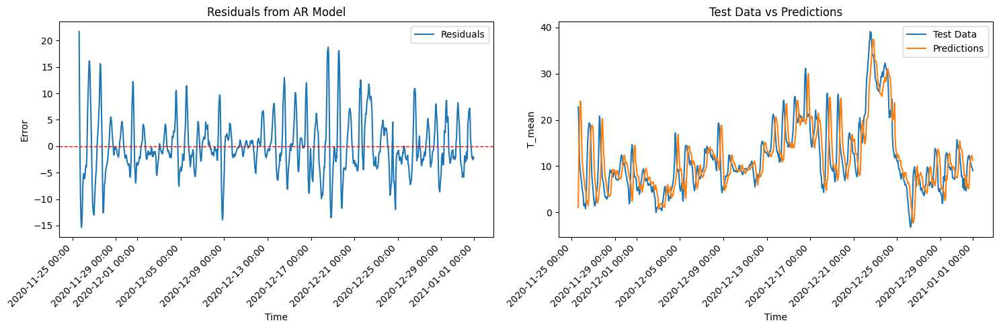

6 steps-ahead forecasts (1H series)
1H Custom AR(1) Training Time: 0.7093
1H Custom AR(1): MAE=3.85, RMSE=5.21, MAPE=101.83


In [ ]:
# 1H n-steps ahead preds custom AR
hor=6 # next 6 hours (or 1 6-hour slot)
preds_custom_1n, (_, _, _), tt1n = predict_recursive_refit(hour_train, hour_test, horizon=hor)

# denormalize, plot and evaluate in original level
preds_custom_denorm1n = preds_custom_1n * T_mean_1H_std + T_mean_1H_mean
hour_test_denorm = hour_test_denorm.loc[preds_custom_denorm1n.index] # align hour_test_denorm to preds index
plot_ar_residuals_and_predictions(hour_test_denorm, preds_custom_denorm1n)
mae_car1n, rmse_car1n, mape_car1n = evaluate_model(hour_test_denorm, preds_custom_denorm1n)

# display time and metrics
print(f"{hor} steps-ahead forecasts (1H series)")
print("1H Custom AR(1) Training Time:", tt1n)
print(f"1H Custom AR(1): MAE={mae_car1n}, RMSE={rmse_car1n}, MAPE={mape_car1n}")

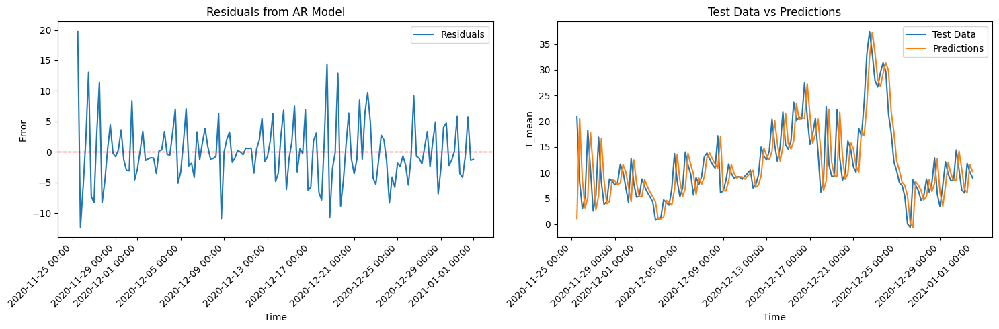

6H Custom AR(1) Training Time: 0.158
6H Custom AR(1): MAE=3.68, RMSE=5.00, MAPE=109.62


In [ ]:
# 6H custom AR (on diffs)
preds_custom_6, (_, _, _), tt6 = predict_recursive_refit(
    six_train_diff, six_test_diff,
    # include original levels (for inside inversion)
    level_train=six_train, level_test=six_test
    )

# denormalize, plot and evaluate
six_test_denorm = six_test * T_mean_6H_std + T_mean_6H_mean
preds_custom_denorm6 = preds_custom_6 * T_mean_6H_std + T_mean_6H_mean
plot_ar_residuals_and_predictions(six_test_denorm, preds_custom_denorm6)
mae_car6, rmse_car6, mape_car6 = evaluate_model(six_test_denorm, preds_custom_denorm6)

# display time and metrics
print("6H Custom AR(1) Training Time:", tt6)
print(f"6H Custom AR(1): MAE={mae_car6}, RMSE={rmse_car6}, MAPE={mape_car6}")

In [ ]:
# preview some preds and trues
print("Test samples' actual values:\n", six_test_denorm.iloc[:5])
print("\nTest samples' predicted values:\n", preds_custom_denorm6.iloc[:5])

Test samples' actual values:
 datetime
2020-11-25 12:00:00    20.855331
2020-11-25 18:00:00     8.187482
2020-11-26 00:00:00     2.961256
2020-11-26 06:00:00     5.195871
2020-11-26 12:00:00    18.206187
Freq: 6h, Name: T_mean, dtype: float64

Test samples' predicted values:
 datetime
2020-11-25 12:00:00     1.120356
2020-11-25 18:00:00    20.527265
2020-11-26 00:00:00     8.605344
2020-11-26 06:00:00     3.113279
2020-11-26 12:00:00     5.129620
Freq: 6h, Name: pred_T_mean, dtype: float64


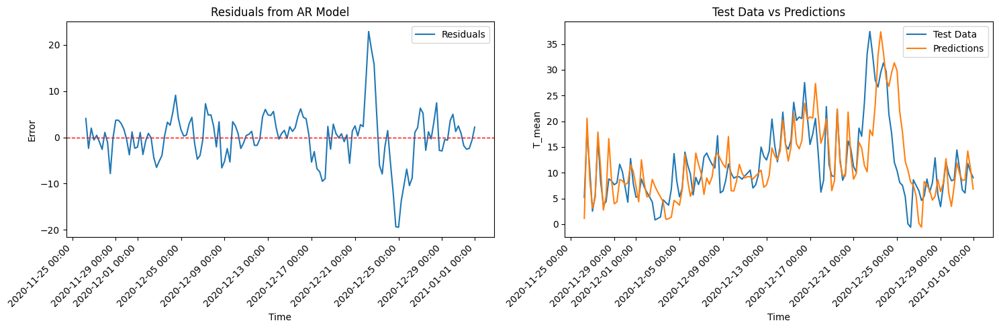

4 steps-ahead forecasts (6H series)
6H Custom AR(1) Training Time: 0.1451
6H Custom AR(1): MAE=3.88, RMSE=5.58, MAPE=192.84


In [ ]:
# 6H n-steps ahead preds custom AR (on diffs)
hor6=4 # 24h ahead on the 6H grid
preds_custom_6n, (_, _, _), tt6n = predict_recursive_refit(
    six_train_diff, six_test_diff, horizon=hor6,
    level_train=six_train, level_test=six_test
    )

# denormalize, plot and evaluate in original level
preds_custom_denorm6n = preds_custom_6n * T_mean_6H_std + T_mean_6H_mean
six_test_denorm = six_test_denorm.loc[preds_custom_denorm6n.index] # align six_test_denorm to preds index
plot_ar_residuals_and_predictions(six_test_denorm, preds_custom_denorm6n)
mae_car6n, rmse_car6n, mape_car6n = evaluate_model(six_test_denorm, preds_custom_denorm6n)

# display time and metrics
print(f"{hor6} steps-ahead forecasts (6H series)")
print("6H Custom AR(1) Training Time:", tt6n)
print(f"6H Custom AR(1): MAE={mae_car6n}, RMSE={rmse_car6n}, MAPE={mape_car6n}")

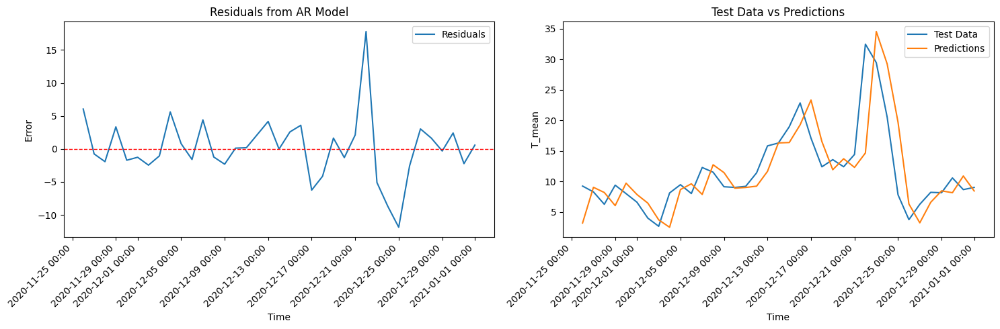

24H Custom AR(1) Training Time: 0.0418
24H Custom AR(1): MAE=3.22, RMSE=4.71, MAPE=29.65


In [ ]:
# 24H custom AR (on diffs)
preds_custom_24, (_, _, _), tt24 = predict_recursive_refit(
    day_train_diff, day_test_diff,
    level_train=day_train, level_test=day_test
    )

# denormalize, plot and evaluate
day_test_denorm = day_test * T_mean_24H_std + T_mean_24H_mean
preds_custom_denorm24 = preds_custom_24 * T_mean_24H_std + T_mean_24H_mean
plot_ar_residuals_and_predictions(day_test_denorm, preds_custom_denorm24)
mae_car24, rmse_car24, mape_car24 = evaluate_model(day_test_denorm, preds_custom_denorm24)

# display time and metrics
print("24H Custom AR(1) Training Time:", tt24)
print(f"24H Custom AR(1): MAE={mae_car24}, RMSE={rmse_car24}, MAPE={mape_car24}")

In [ ]:
# preview some preds and trues
print("Test samples' actual values:\n", day_test_denorm.iloc[:5])
print("\nTest samples' predicted values:\n", preds_custom_denorm24.iloc[:5])

Test samples' actual values:
 datetime
2020-11-26    9.253810
2020-11-27    8.299947
2020-11-28    6.276077
2020-11-29    9.402432
2020-11-30    8.018766
Freq: D, Name: T_mean, dtype: float64

Test samples' predicted values:
 datetime
2020-11-26    3.205262
2020-11-27    9.051309
2020-11-28    8.200838
2020-11-29    6.057998
2020-11-30    9.727970
Freq: D, Name: pred_T_mean, dtype: float64


In [ ]:
ar_custom_results = [
    ("Custom AR(1)", "1-hour", "t+1", "T_mean", "Univariate", mae_car1, rmse_car1, mape_car1, tt1, 2),
    ("Custom AR(1)", "1-hour", "t+6", "T_mean", "Univariate", mae_car1n, rmse_car1n, mape_car1n, tt1n, 2),
    ("Custom AR(1)", "6-hour", "t+1", "T_mean", "Univariate", mae_car6, rmse_car6, mape_car6, tt6, 2),
    ("Custom AR(1)", "6-hour", "t+4", "T_mean", "Univariate", mae_car6n, rmse_car6n, mape_car6n, tt6n, 2),
    ("Custom AR(1)", "24-hour", "t+1", "T_mean", "Univariate", mae_car24, rmse_car24, mape_car24, tt24, 2)
]

In [ ]:
# print ar_custom_results
print(tabulate(ar_custom_results, headers=columns, tablefmt="github", floatfmt=".2f"))

| Model        | Resolution   | Horizon   | Target Variable   | Input Type   |   MAE |   RMSE |   MAPE (%) |   Fit Time |   # Params |
|--------------|--------------|-----------|-------------------|--------------|-------|--------|------------|------------|------------|
| Custom AR(1) | 1-hour       | t+1       | T_mean            | Univariate   |  0.94 |   1.40 |      23.09 |       0.70 |          2 |
| Custom AR(1) | 1-hour       | t+6       | T_mean            | Univariate   |  3.85 |   5.21 |     101.83 |       0.71 |          2 |
| Custom AR(1) | 6-hour       | t+1       | T_mean            | Univariate   |  3.68 |   5.00 |     109.62 |       0.16 |          2 |
| Custom AR(1) | 6-hour       | t+4       | T_mean            | Univariate   |  3.88 |   5.58 |     192.84 |       0.15 |          2 |
| Custom AR(1) | 24-hour      | t+1       | T_mean            | Univariate   |  3.22 |   4.71 |      29.65 |       0.04 |          2 |


## Results

In [ ]:
# combine results and print
all_results = ar_results + ar_custom_results
print(tabulate(all_results, headers=columns, tablefmt="github", floatfmt=".2f"))

| Model        | Resolution   | Horizon   | Target Variable   | Input Type   |   MAE |   RMSE |   MAPE (%) |   Fit Time |   # Params |
|--------------|--------------|-----------|-------------------|--------------|-------|--------|------------|------------|------------|
| AR(1)        | 1-hour       | t+1       | T_mean            | Univariate   |  0.94 |   1.40 |      23.09 |       3.53 |          2 |
| AR(1)        | 1-hour       | t+6       | T_mean            | Univariate   |  3.85 |   5.21 |     101.83 |       3.56 |          2 |
| AR(1)        | 6-hour       | t+1       | T_mean            | Univariate   |  3.68 |   5.00 |     109.62 |       0.49 |          2 |
| AR(1)        | 6-hour       | t+4       | T_mean            | Univariate   |  3.88 |   5.58 |     192.84 |       0.50 |          2 |
| AR(1)        | 24-hour      | t+1       | T_mean            | Univariate   |  3.22 |   4.71 |      29.65 |       0.12 |          2 |
| Custom AR(1) | 1-hour       | t+1       | T_mean     

$AR(1):$ **Custom vs Statsmodels**

*   **Metrics:** identical MAE/RMSE/MAPE, which is somehow expected, as both are fitted on the same data and evaluated under the same regime.

*   **Time:** Computation scales mostly with the number of operations (model) and observations (number of rows). The simpler model plus fewer rows at lower-frequency resolutions ⇒ less work ⇒ faster fits and forecasts.

*   **Horizon-native > Long Recursion:** 1H needs 6 recursive steps to reach +6h (errors compound), while 6H does one step. Likewise 6H(+4) vs 24H(+1). Therefore 1H(h=6) < 6H(h=1) and 6H(h=4) < 24H(h=1).

In [ ]:
# save and download all_results
all_results_df = pd.DataFrame(all_results, columns=columns)
all_results_df.to_csv("ar_results.csv", index=False)
files.download("ar_results.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Future Work and References


**Future Work**

*   Go multivariate. Extend the pipeline beyond temperature:
  
  - repeat the univariate workflow for other targets (e.g. rh, SWDR)

  - predict temperature using additional signals (e.g. SWDR, rh) as inputs

*   Depending on each series' characteristics (stationarity, seasonality, etc.), choose a compatible AR-family model, e.g. AR, VAR, ARMA/ARIMA, SARIMA, etc., and compare under the same evaluation protocol.

**References**

[1]: [Time Series Analysis and Forecasting](https://www.geeksforgeeks.org/machine-learning/time-series-analysis-and-forecasting/)

[2]: [Autoregressive (AR) Model for Time Series Forecasting](https://www.geeksforgeeks.org/data-analysis/autoregressive-ar-model-for-time-series-forecasting/)

[3]: [Time Series Analysis](https://www.youtube.com/watch?v=ZoJ2OctrFLA&list=PLvcbYUQ5t0UHOLnBzl46_Q6QKtFgfMGc3)